In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
from torchvision.models import vgg16, vgg19
from torchvision import transforms
import glob
import numpy as np
from PIL import Image
from tqdm import tqdm
from collections import namedtuple
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [2]:
torch.__version__

'2.2.2+cu121'

In [11]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    print("Training on GPU!")
else:
    device = torch.device('cpu')
    print("Training on CPU :(")

Training on GPU!


### Архитектура модели

In [3]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResidualBlock, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        
        self.conv = nn.Conv2d(in_channels = self.in_channels,
                               out_channels = self.out_channels,
                               kernel_size = 3)
        self.batch_norm = nn.InstanceNorm2d(self.out_channels, affine=True)
        self.relu = nn.ReLU()

    def forward(self, x):
        # First convolution
        orig_x = x.clone()
        x = self.conv(x)
        x = self.batch_norm(x)
        x = self.relu(x)
        
        # Second convolution
        x = self.conv(x)
        x = self.batch_norm(x)
        
        # Now add the original to the new one (and use center cropping)
        # Calulate the different between the size of each feature (in terms 
        # of height/width) to get the center of the original feature
        height_diff = orig_x.size()[2] - x.size()[2]
        width_diff = orig_x.size()[3] - x.size()[3]
        
        # Add the original to the new (complete the residual block)
        x = x + orig_x[:, :,
                                 height_diff//2:(orig_x.size()[2] - height_diff//2), 
                                 width_diff//2:(orig_x.size()[3] - width_diff//2)]
        
        return x

In [4]:
class ImageTransformationNetwork(nn.Module):
    def __init__(self):
        super(ImageTransformationNetwork, self).__init__()
        # Use reflection padding to keep the end shape
        self.ref_pad = nn.ReflectionPad2d(40)
        
        # Initial convolutions
        self.conv1 = nn.Conv2d(in_channels = 3,
                               out_channels = 32,
                               kernel_size = 9,
                               padding = 6,
                               padding_mode = 'reflect')
        
        self.conv2 = nn.Conv2d(in_channels = 32,
                               out_channels = 64,
                               kernel_size = 3,
                               stride = 2)
        
        self.conv3 = nn.Conv2d(in_channels = 64,
                               out_channels = 128,
                               kernel_size = 3,
                               stride = 2)
        
        # Residual Blocks
        self.resblock1 = ResidualBlock(in_channels = 128,
                                       out_channels = 128)
        
        self.resblock2 = ResidualBlock(in_channels = 128,
                                       out_channels = 128)
        
        self.resblock3 = ResidualBlock(in_channels = 128,
                                       out_channels = 128)
        
        self.resblock4 = ResidualBlock(in_channels = 128,
                                       out_channels = 128)
        
        self.resblock5 = ResidualBlock(in_channels = 128,
                                       out_channels = 128)
        
        # Transpose convoltutions
        self.trans_conv1 = nn.ConvTranspose2d(in_channels=128,
                                             out_channels=64,
                                             kernel_size=2,
                                             stride=2)
        
        self.trans_conv2 = nn.ConvTranspose2d(in_channels=64,
                                              out_channels=32,
                                              kernel_size=2,
                                              stride=2)
        
        # End with one last convolution
        self.conv4 = nn.Conv2d(in_channels = 32,
                               out_channels = 3,
                               kernel_size = 9,
                               padding = 4,
                               padding_mode = 'reflect')
        
    def forward(self, x):
        # Apply reflection padding
        x = self.ref_pad(x)
        
        # Apply the initial convolutions
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        
        # Apply the residual blocks
        x = self.resblock1(x)
        x = self.resblock2(x)
        x = self.resblock3(x)
        x = self.resblock4(x)
        x = self.resblock5(x)        
        
        #  Apply the transpose convolutions
        x = self.trans_conv1(x)
        x = self.trans_conv2(x)
        
        # Apply the final convolution
        x = self.conv4(x)
        
        return x

In [6]:
# Test to confirm the residual network works
resblock = ResidualBlock(128, 128)
test = torch.randn(2, 128, 84, 84)
out = resblock(test)
print(out.size())

torch.Size([2, 128, 80, 80])


In [7]:
# Test to confirm the transormational network works
transformation_net = ImageTransformationNetwork()
test = torch.randn(2, 3, 256, 256)
out = transformation_net(test)
print(out.size())

torch.Size([2, 3, 256, 256])


In [8]:
class ForwardVGG19(torch.nn.Module):
    def __init__(self):
        super(ForwardVGG19, self).__init__()
        features = list(vgg19(pretrained=True).features)
        self.features = nn.ModuleList(features).eval()
        
    def forward(self, x, style):
        results = []
        for i, model in enumerate(self.features):
            x = model(x)
            if style:
                if i in {3, 8, 15, 22}:
                    results.append(x)
            
            else:
                if i == 15:
                    results.append(x)
        
        return results

forward_vgg = ForwardVGG19().to(device)

c:\Users\alex_\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\alex_\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [9]:
def normalize_batch(batch):
    """
    Before we send an image into the VGG19, we have to normalize it
    """
    # Define the means and standard deviations
    vgg_means = [0.485, 0.456, 0.406]
    vgg_std = [0.229, 0.224, 0.225]
    
    # Clone the batch to make changes to it
    ret = batch.clone()
    
    # Normalize to between 0 and 255 (input image is 255-value images, not floats)
    ret = ret / 255.0
    
    # Subtract the means and divide by the standard deviations
    ret[:, 0, :, :] = (ret[:, 0, :, :] - vgg_means[0]) / vgg_std[0]
    ret[:, 1, :, :] = (ret[:, 1, :, :] - vgg_means[1]) / vgg_std[1]
    ret[:, 2, :, :] = (ret[:, 2, :, :] - vgg_means[2]) / vgg_std[2]
    return ret

In [10]:
def denormalize_batch(batch):
    vgg_means = [123.68, 116.779, 103.94]
    ret = torch.zeros(*batch.size())
    ret[:, 0, :, :] = batch[:, 0, :, :] + vgg_means[0]
    ret[:, 1, :, :] = batch[:, 1, :, :] + vgg_means[1]
    ret[:, 2, :, :] = batch[:, 2, :, :] + vgg_means[2]
    return ret

In [11]:
def add_noise(batch):
    """
    For the input image, we have to add noise so that the loss between the content image and 
    input image is not 0
    """
    mean = 0.0
    std = 10.0
    ret = batch + np.random.normal(mean, std, batch.shape)
    ret = np.clip(batch, 0, 255)
    return ret

In [12]:
def compute_gram(matrix):
    """
    Computes the gram matrix
    """
    batches, channels, height, width = matrix.size()
    return (1/(channels * height * width)) * (torch.matmul(matrix.view(batches, channels, -1),
                                                torch.transpose(matrix.view(batches, channels, -1), 1, 2)))


In [13]:
def content_cost(input, target):
    # First normalize both the input and target (preprocess for VGG16)
    input_norm = normalize_batch(input)
    target_norm = normalize_batch(target)

    input_layers = forward_vgg(input_norm, False)
    target_layers = forward_vgg(target_norm, False)

    accumulated_loss = 0
    for layer in range(len(input_layers)):
        batches, channels, height, width = input_layers[layer].size()
        accumulated_loss = accumulated_loss + torch.mean(torch.square(input_layers[layer] - target_layers[layer]))
    
    return accumulated_loss

In [14]:
def style_cost(input, target):
    # First normalize both the input and target (preprocess for VGG16)
    input_norm = normalize_batch(input)
    target_norm = normalize_batch(target)

    input_layers = forward_vgg(input_norm, True)
    target_layers = forward_vgg(target_norm, True)
    
    # layer weights
    layer_weights = [0.3, 0.7, 0.7, 0.3]
    
    # The accumulated losses for the style
    accumulated_loss = 0
    for layer in range(len(input_layers)):
        batches, channels, height, width = input_layers[layer].size()
        accumulated_loss = accumulated_loss + layer_weights[layer] * \
                            torch.mean(torch.square(compute_gram(input_layers[layer]) -
                                                    compute_gram(target_layers[layer])))
    
    return accumulated_loss

In [15]:
def total_variation_cost(input):
    tvloss = (
        torch.sum(torch.abs(input[:, :, :, :-1] - input[:, :, :, 1:])) + 
        torch.sum(torch.abs(input[:, :, :-1, :] - input[:, :, 1:, :]))
    )
    return tvloss

In [16]:
content_losses = []
style_losses = []
tv_losses = []

In [17]:
def total_cost(input, targets):
    # Weights
    REG_TV = 1e-6
    REG_STYLE = 1e6
    REG_CONTENT = 50
    
    # Extract content and style images
    content, style = targets
    
    # Get the content, style and tv variation losses
    closs = content_cost(input, content) * REG_CONTENT
    sloss = style_cost(input, style) * REG_STYLE
    tvloss = total_variation_cost(input) * REG_TV
        
    # Add it to the running list of losses
    content_losses.append(closs)
    style_losses.append(sloss)
    tv_losses.append(tvloss)
    
    print('****************************')
    print('Content Loss: {}'.format(closs.item()))
    print('Style Loss: {}'.format(sloss.item()))
    print('Total Variation Loss: {}'.format(tvloss.item()))
        
    # Apply the weights and add
    return closs + sloss + tvloss
    

### Загрузка данных

In [9]:
# Constants
IMG_DIMENSIONS = (256, 256)
DATA = list(glob.iglob('C:/PythonProjects/2year/10.DL_CV/data/train/images/*'))
STYLE_IMAGE = np.asarray(Image.open('images/style/matrix.jpg').resize(IMG_DIMENSIONS)).transpose(2, 0, 1)[0:3]

# Make the style image a batch and convert
STYLE_IMAGE = STYLE_IMAGE.reshape(1, 3, 256, 256)
TOTAL_DATA = len(DATA)
MAX_TRAIN = int(TOTAL_DATA * 0.8)
MAX_VAL = int(TOTAL_DATA * 0.2)

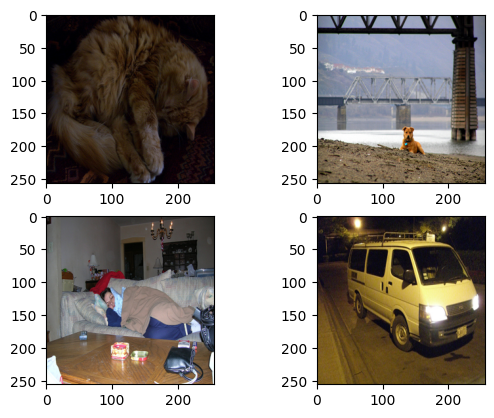

In [19]:
def show_sample_images():
    f, axarr = plt.subplots(2,2)
    
    # Show colored images
    axarr[0,0].imshow(np.asarray(Image.open(DATA[0]).resize(IMG_DIMENSIONS)))
    axarr[0,1].imshow(np.asarray(Image.open(DATA[4]).resize(IMG_DIMENSIONS)))
    axarr[1,0].imshow(np.asarray(Image.open(DATA[8]).resize(IMG_DIMENSIONS)))
    
    # Grayscale example
    grayscale = np.asarray(Image.open(DATA[13]).resize(IMG_DIMENSIONS))
    #grayscale = np.stack((grayscale, grayscale, grayscale)).transpose(1, 2, 0)
    axarr[1,1].imshow(grayscale)
    
show_sample_images()

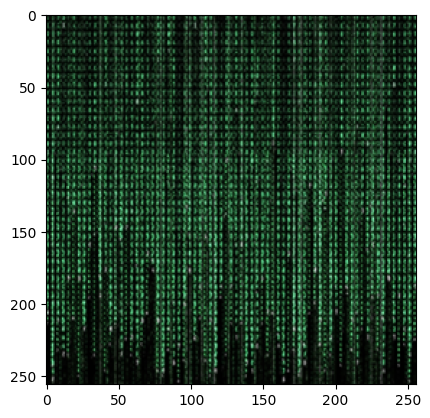

In [20]:
# Show the chosen style image
plt.imshow(STYLE_IMAGE[0].transpose(1, 2, 0))

In [21]:
def load_training_batch(current_batch, batch_size, set_type):
    """
    Load different batches of data (essentially a custom data loader for training, validation, and testing)
    """
    # The initial position is where we want to start getting the batch
    # So it is the starting index of the batch
    initial_pos = current_batch * batch_size
    
    # List to store the images
    images = []
    
    if set_type == 'train':
        end_pos = min(initial_pos + batch_size, MAX_TRAIN) 
    elif set_type == 'val':
        # Исправленная логика для валидационного набора
        initial_pos = MAX_TRAIN + (current_batch * batch_size) 
        end_pos = min(initial_pos + batch_size, TOTAL_DATA) 
    elif set_type == 'test':
        initial_pos = MAX_VAL + (current_batch * batch_size)
        end_pos = min(initial_pos + batch_size, TOTAL_DATA)  

    for f in DATA[initial_pos:initial_pos + batch_size]:
        # Resize the image to 256 x 256
        image = np.asarray(Image.open(f).resize(IMG_DIMENSIONS))
        
        # If the image is grayscale, stack the image 3 times to get 3 channels
        if image.shape == IMG_DIMENSIONS:
            image = np.stack((image, image, image))
            images.append(image)
            continue
            
        # Transpose the image to have channels first
        image = image.transpose(2, 0, 1)
        images.append(image)
    
    return np.array(images)

In [26]:
def training_show_img():
    # Get an image from the validation set
    img = load_training_batch(0, 10, 'val')[4]
    
    # Convert to tensor
    train_img = torch.from_numpy(img.reshape(1, 3, 256, 256)).float().to(device)
    
    # Put through network
    gen_img = transformation_net(train_img)
    gen_img = gen_img.detach().cpu().numpy()
    
    # Clip the floats
    gen_img = np.clip(gen_img, 0, 255)
    
    # Convert to ints (for images)
    gen_img = gen_img.astype('uint8')
    gen_img = gen_img.reshape(3, 256, 256).transpose(1, 2, 0)
    
    # Show the image
    plt.imshow(gen_img)
    plt.show()

In [31]:
def show_img(img):
    # Convert to tensor
    img = torch.from_numpy(img).float().to(device)
    img = img.view(1, 3, 256, 256)
    # Put through network
    display(img.shape)
    gen_img = transformation_net(img)
    gen_img = gen_img.detach().cpu().numpy()
    
    # Clip the floats
    gen_img = np.clip(gen_img, 0, 255)
    
    # Convert to ints (for images)
    gen_img = gen_img.astype('uint8')
    gen_img = gen_img.reshape(3, 256, 256).transpose(1, 2, 0)
    
    # Show the image
    plt.imshow(gen_img)
    plt.show()

In [24]:
def plot_losses():
    # Print info about content losses
    with torch.no_grad():
        plt.plot([x.cpu() for x in content_losses[int(len(content_losses) * 0.0):]])
        plt.show()
        print(content_losses[len(content_losses) - 1])

        # Print info about style losses
        plt.plot([x.cpu() for x in style_losses[int(len(style_losses) * 0.0):]])
        plt.show()
        print(style_losses[len(style_losses) - 1])

        # Print info about total variation losses
        plt.plot([x.cpu() for x in tv_losses[int(len(tv_losses) * 0.0):]])
        plt.show()
        print(tv_losses[len(tv_losses) - 1])

### Обучение

In [25]:
BATCH_SIZE = 4
STYLE_IMAGE_TENSOR = torch.from_numpy(np.copy(STYLE_IMAGE)).float()
transformation_net = ImageTransformationNetwork().to(device)
opt = optim.Adam(transformation_net.parameters(), lr=1e-3)

****************************
Content Loss: 716.0405883789062
Style Loss: 1701.5711669921875
Total Variation Loss: 3.315385341644287
Training Batch: 1 Loss: 2420.927246
****************************
****************************
Content Loss: 1362.447021484375
Style Loss: 3336.888427734375
Total Variation Loss: 7.7811150550842285
Training Batch: 2 Loss: 4707.116699
****************************
****************************
Content Loss: 1381.596435546875
Style Loss: 3929.91162109375
Total Variation Loss: 10.306201934814453
Training Batch: 3 Loss: 5321.813965
****************************
****************************
Content Loss: 1083.7969970703125
Style Loss: 2281.6044921875
Total Variation Loss: 13.722671508789062
Training Batch: 4 Loss: 3379.124023
****************************
****************************
Content Loss: 1045.8681640625
Style Loss: 1568.0955810546875
Total Variation Loss: 10.492391586303711
Training Batch: 5 Loss: 2624.456299
****************************
******************

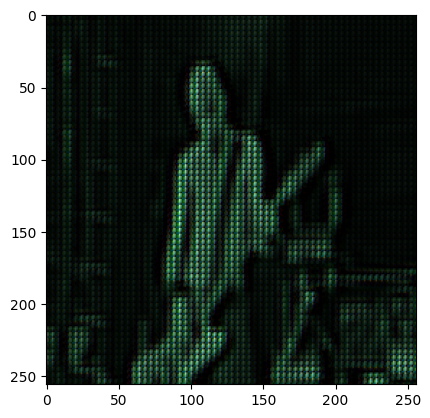

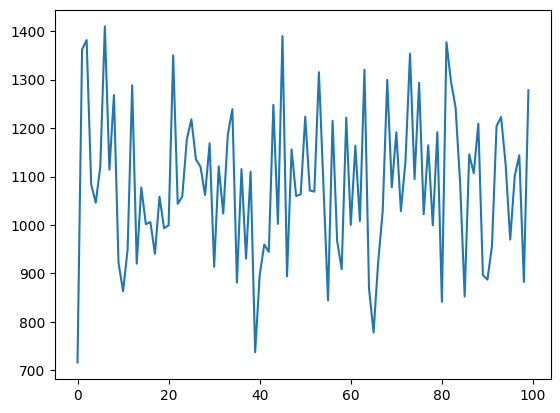

tensor(1277.9624, device='cuda:0', grad_fn=<MulBackward0>)


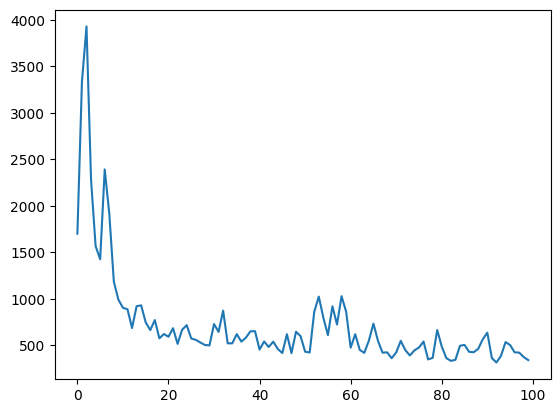

tensor(342.1889, device='cuda:0', grad_fn=<MulBackward0>)


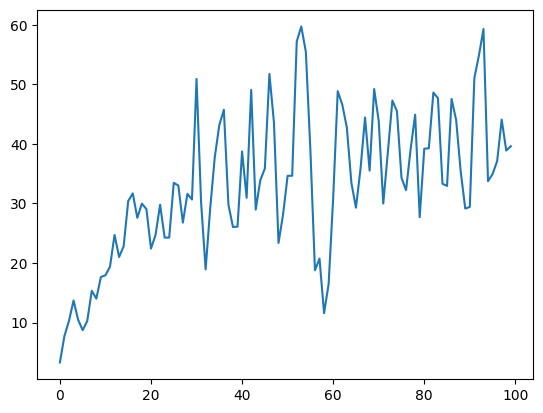

tensor(39.5970, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 1076.660888671875
Style Loss: 434.12677001953125
Total Variation Loss: 46.56681442260742
Training Batch: 101 Loss: 1557.354370
****************************
****************************
Content Loss: 970.4517211914062
Style Loss: 502.0944519042969
Total Variation Loss: 37.09988784790039
Training Batch: 102 Loss: 1509.645996
****************************
****************************
Content Loss: 891.7208862304688
Style Loss: 449.0048522949219
Total Variation Loss: 37.07426834106445
Training Batch: 103 Loss: 1377.799927
****************************
****************************
Content Loss: 1014.5460205078125
Style Loss: 368.7884826660156
Total Variation Loss: 46.69658279418945
Training Batch: 104 Loss: 1430.031006
****************************
****************************
Content Loss: 1197.7491455078125
Style Loss: 402.2712097167969
Total Variation Loss: 36.14244842529297
Training Batch: 1

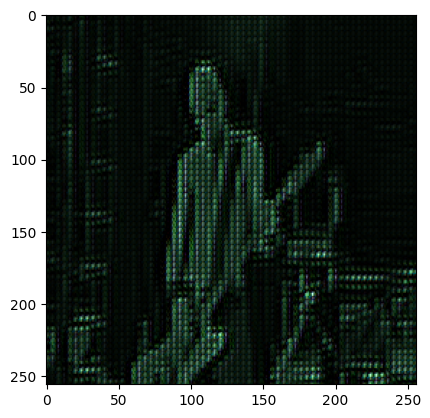

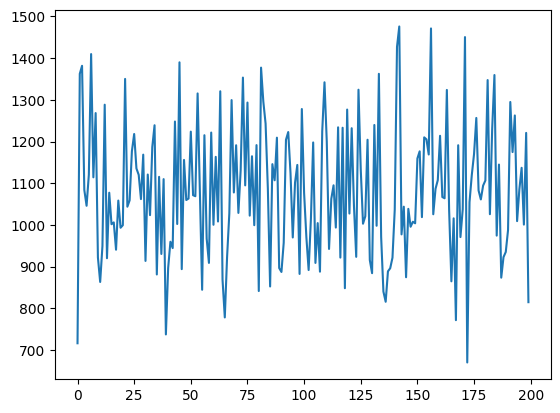

tensor(814.6034, device='cuda:0', grad_fn=<MulBackward0>)


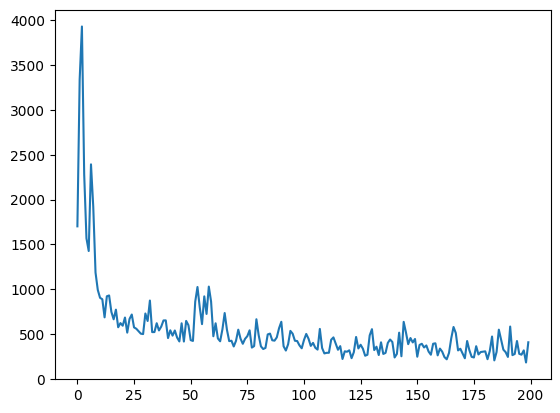

tensor(409.0403, device='cuda:0', grad_fn=<MulBackward0>)


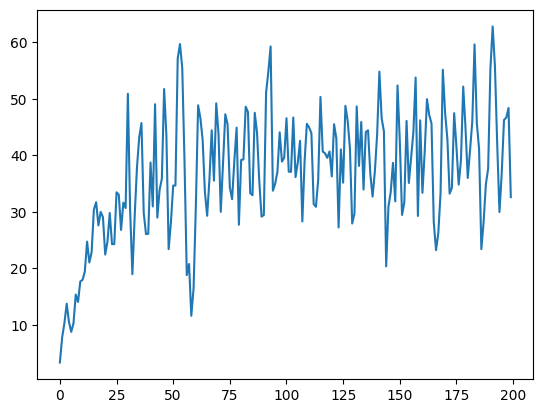

tensor(32.5919, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 1123.88037109375
Style Loss: 385.2598571777344
Total Variation Loss: 32.826812744140625
Training Batch: 201 Loss: 1541.967041
****************************
****************************
Content Loss: 940.2101440429688
Style Loss: 313.1300354003906
Total Variation Loss: 35.89904022216797
Training Batch: 202 Loss: 1289.239258
****************************
****************************
Content Loss: 1098.3399658203125
Style Loss: 236.05406188964844
Total Variation Loss: 40.33221435546875
Training Batch: 203 Loss: 1374.726318
****************************
****************************
Content Loss: 1580.7060546875
Style Loss: 245.3780975341797
Total Variation Loss: 54.954280853271484
Training Batch: 204 Loss: 1881.038330
****************************
****************************
Content Loss: 1349.65673828125
Style Loss: 171.07594299316406
Total Variation Loss: 47.54430389404297
Training Batch: 205

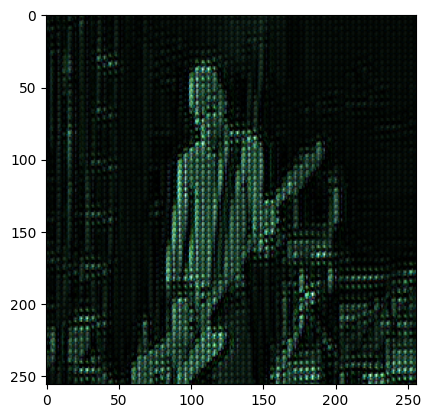

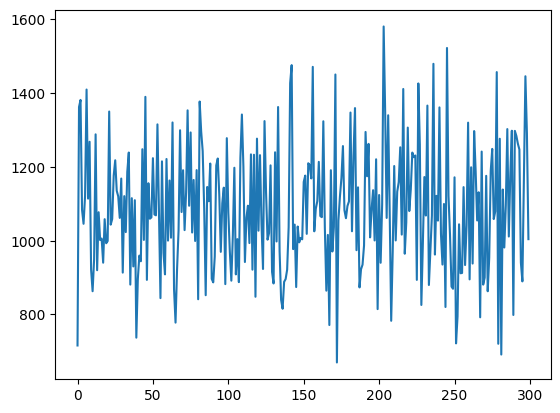

tensor(1004.2358, device='cuda:0', grad_fn=<MulBackward0>)


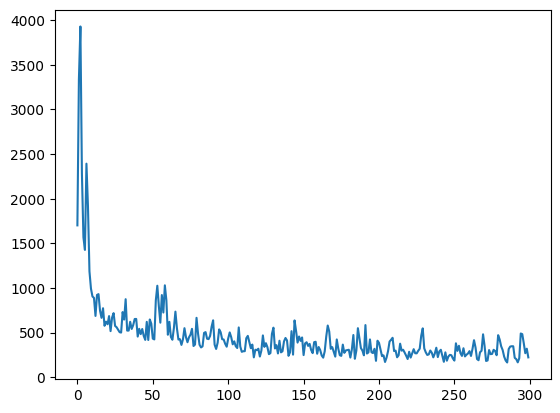

tensor(222.7103, device='cuda:0', grad_fn=<MulBackward0>)


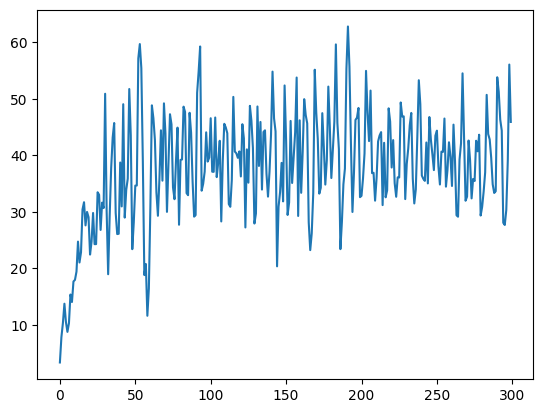

tensor(45.9094, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 906.8561401367188
Style Loss: 315.04473876953125
Total Variation Loss: 37.34797668457031
Training Batch: 301 Loss: 1259.248901
****************************
****************************
Content Loss: 1393.3038330078125
Style Loss: 282.9620666503906
Total Variation Loss: 34.01376724243164
Training Batch: 302 Loss: 1710.279663
****************************
****************************
Content Loss: 1128.01025390625
Style Loss: 186.52597045898438
Total Variation Loss: 45.20238494873047
Training Batch: 303 Loss: 1359.738647
****************************
****************************
Content Loss: 1257.8433837890625
Style Loss: 196.5505828857422
Total Variation Loss: 48.38380813598633
Training Batch: 304 Loss: 1502.777710
****************************
****************************
Content Loss: 860.6859130859375
Style Loss: 353.0369873046875
Total Variation Loss: 31.502676010131836
Training Batch: 

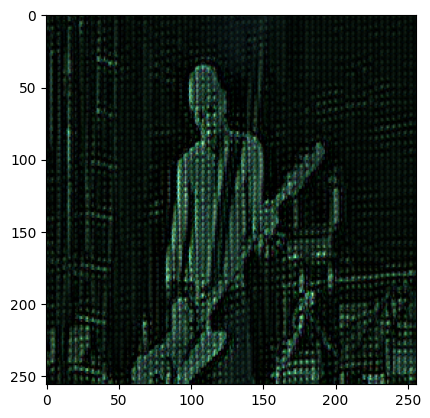

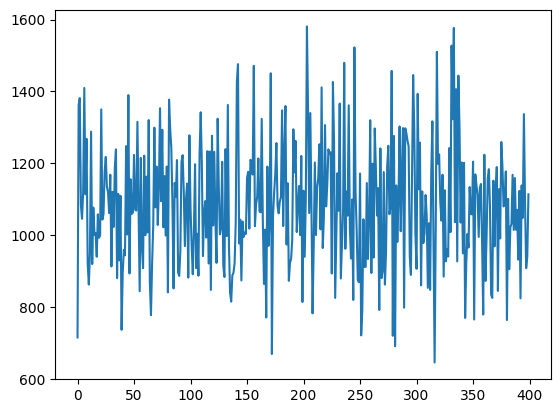

tensor(1113.9053, device='cuda:0', grad_fn=<MulBackward0>)


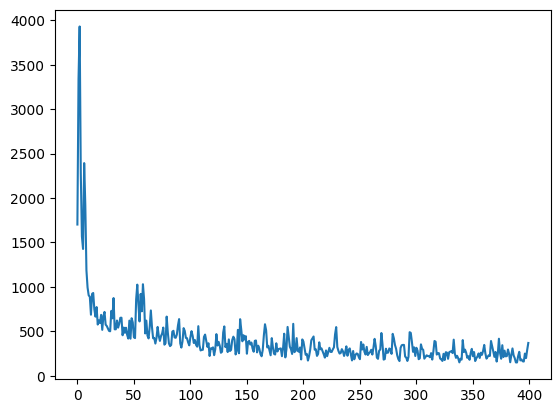

tensor(369.1433, device='cuda:0', grad_fn=<MulBackward0>)


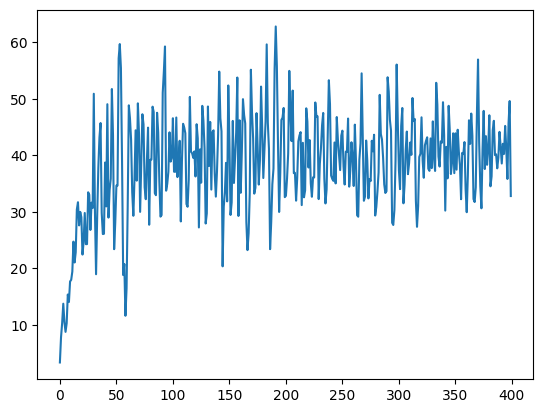

tensor(32.7901, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 995.2794799804688
Style Loss: 339.9560852050781
Total Variation Loss: 32.9196891784668
Training Batch: 401 Loss: 1368.155273
****************************
****************************
Content Loss: 912.2722778320312
Style Loss: 244.78489685058594
Total Variation Loss: 45.000492095947266
Training Batch: 402 Loss: 1202.057617
****************************
****************************
Content Loss: 1015.1763916015625
Style Loss: 247.61817932128906
Total Variation Loss: 36.10628128051758
Training Batch: 403 Loss: 1298.900879
****************************
****************************
Content Loss: 1177.833984375
Style Loss: 223.00709533691406
Total Variation Loss: 47.627479553222656
Training Batch: 404 Loss: 1448.468506
****************************
****************************
Content Loss: 930.7362670898438
Style Loss: 174.40158081054688
Total Variation Loss: 40.05666732788086
Training Batch: 4

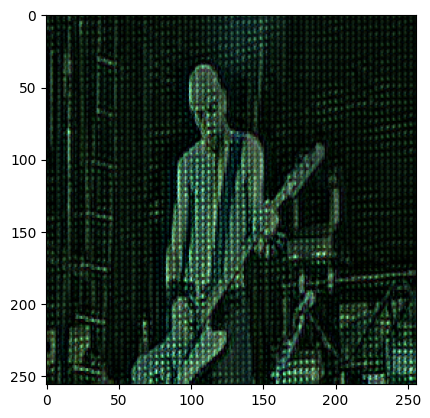

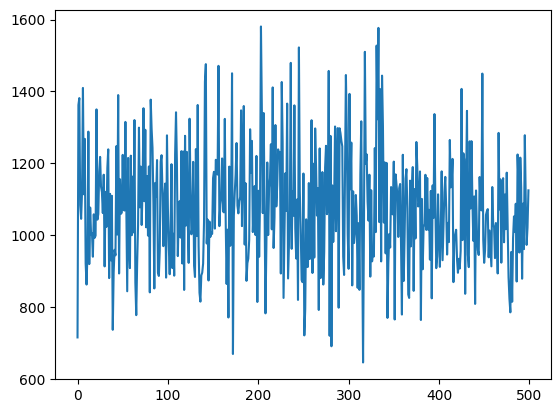

tensor(1125.0122, device='cuda:0', grad_fn=<MulBackward0>)


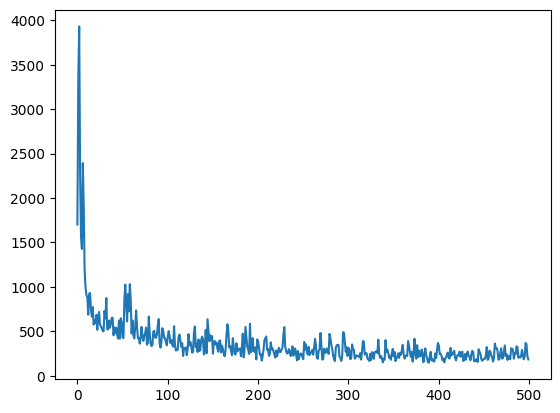

tensor(183.5341, device='cuda:0', grad_fn=<MulBackward0>)


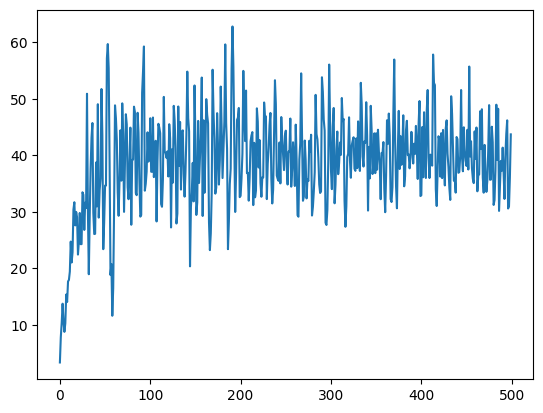

tensor(43.7104, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 1054.695556640625
Style Loss: 153.53260803222656
Total Variation Loss: 43.12604522705078
Training Batch: 501 Loss: 1251.354248
****************************
****************************
Content Loss: 870.3943481445312
Style Loss: 215.14752197265625
Total Variation Loss: 37.943668365478516
Training Batch: 502 Loss: 1123.485596
****************************
****************************
Content Loss: 1020.9302978515625
Style Loss: 256.5438232421875
Total Variation Loss: 34.42317581176758
Training Batch: 503 Loss: 1311.897339
****************************
****************************
Content Loss: 902.9651489257812
Style Loss: 174.10470581054688
Total Variation Loss: 41.00431823730469
Training Batch: 504 Loss: 1118.074097
****************************
****************************
Content Loss: 981.8660888671875
Style Loss: 219.9628448486328
Total Variation Loss: 44.069236755371094
Training Batch

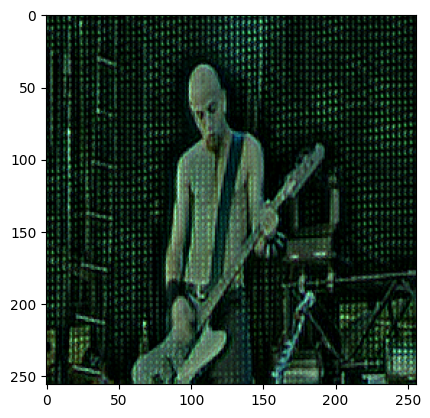

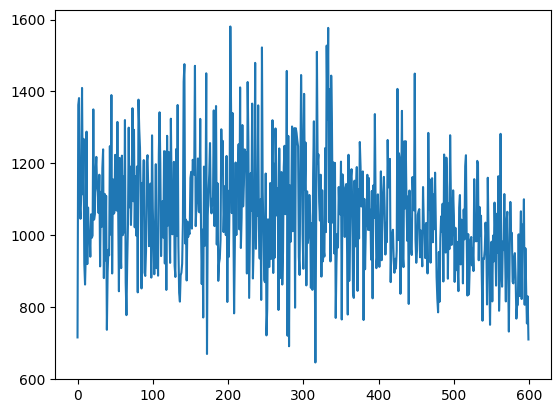

tensor(710.3449, device='cuda:0', grad_fn=<MulBackward0>)


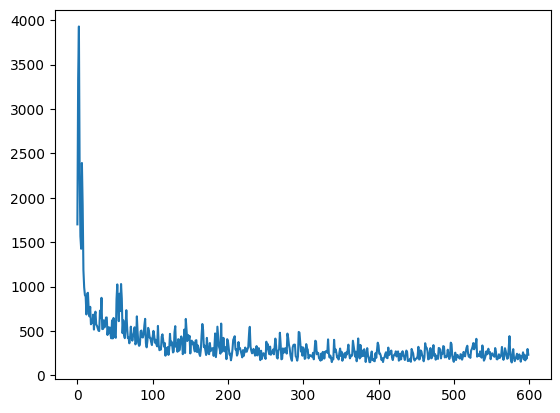

tensor(233.7755, device='cuda:0', grad_fn=<MulBackward0>)


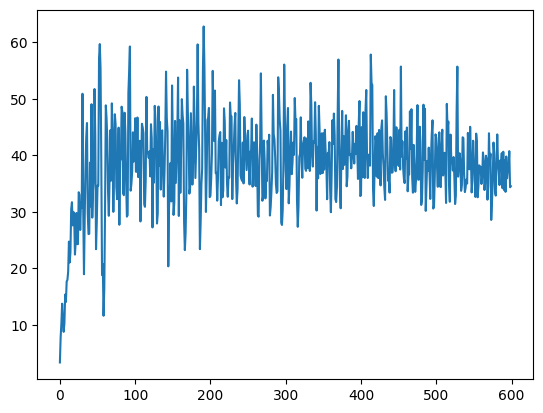

tensor(34.5411, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 773.8826904296875
Style Loss: 168.5504913330078
Total Variation Loss: 40.00049591064453
Training Batch: 601 Loss: 982.433655
****************************
****************************
Content Loss: 1015.0659790039062
Style Loss: 167.33663940429688
Total Variation Loss: 41.67958068847656
Training Batch: 602 Loss: 1224.082153
****************************
****************************
Content Loss: 1023.0027465820312
Style Loss: 215.19337463378906
Total Variation Loss: 34.94258499145508
Training Batch: 603 Loss: 1273.138794
****************************
****************************
Content Loss: 892.0877685546875
Style Loss: 270.3678894042969
Total Variation Loss: 32.8018684387207
Training Batch: 604 Loss: 1195.257568
****************************
****************************
Content Loss: 1061.7103271484375
Style Loss: 207.73509216308594
Total Variation Loss: 40.20866775512695
Training Batch: 

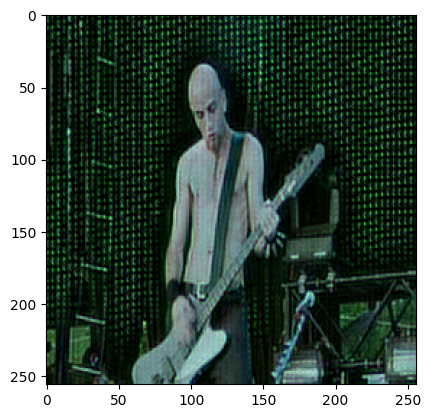

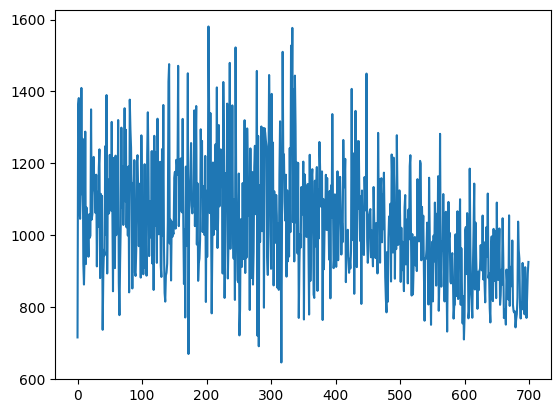

tensor(925.9446, device='cuda:0', grad_fn=<MulBackward0>)


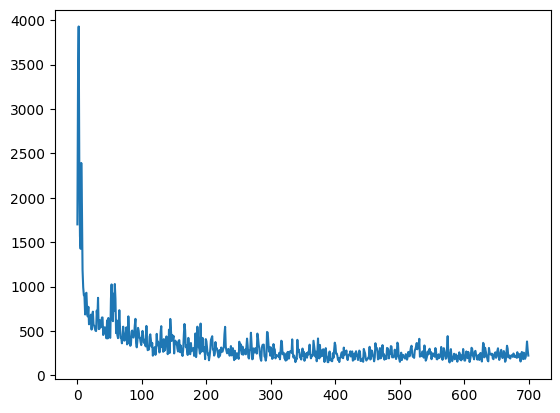

tensor(224.0397, device='cuda:0', grad_fn=<MulBackward0>)


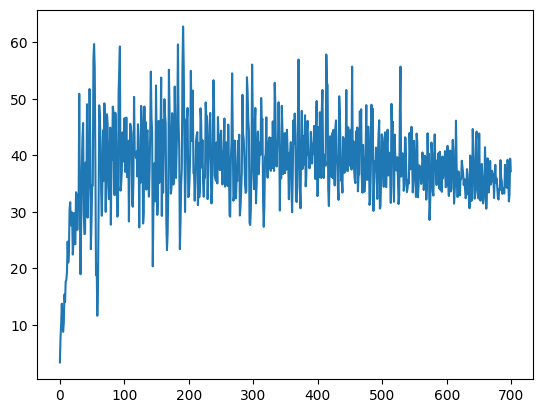

tensor(37.1835, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 806.65966796875
Style Loss: 310.8440856933594
Total Variation Loss: 37.813880920410156
Training Batch: 701 Loss: 1155.317627
****************************
****************************
Content Loss: 842.3826904296875
Style Loss: 188.48013305664062
Total Variation Loss: 36.88251876831055
Training Batch: 702 Loss: 1067.745361
****************************
****************************
Content Loss: 906.639892578125
Style Loss: 255.32566833496094
Total Variation Loss: 34.054054260253906
Training Batch: 703 Loss: 1196.019653
****************************
****************************
Content Loss: 821.23486328125
Style Loss: 187.81661987304688
Total Variation Loss: 32.727272033691406
Training Batch: 704 Loss: 1041.778809
****************************
****************************
Content Loss: 770.2332763671875
Style Loss: 263.582275390625
Total Variation Loss: 33.16157531738281
Training Batch: 705 

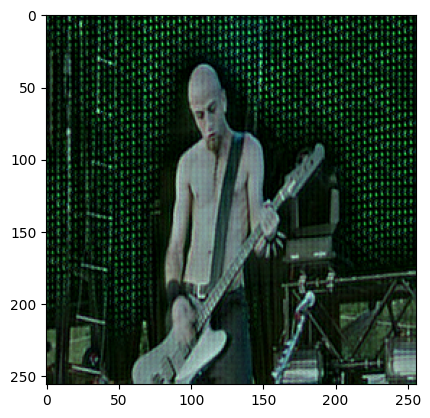

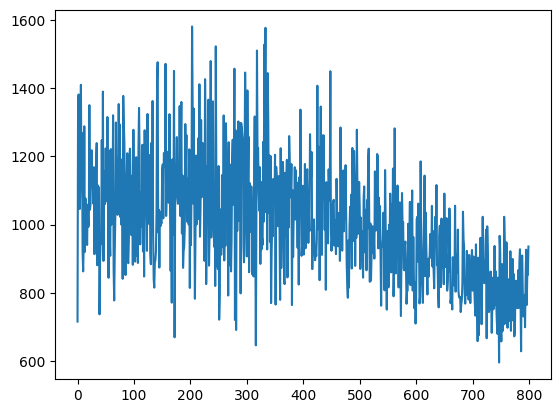

tensor(935.9240, device='cuda:0', grad_fn=<MulBackward0>)


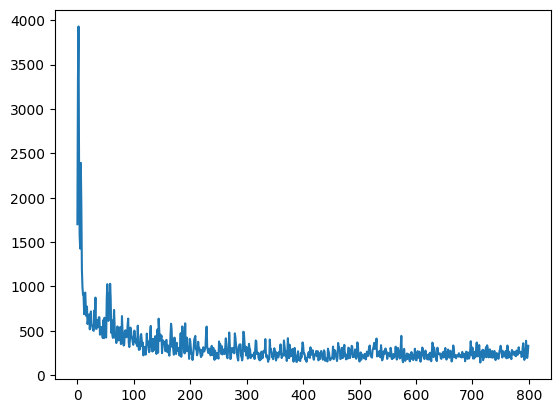

tensor(330.9214, device='cuda:0', grad_fn=<MulBackward0>)


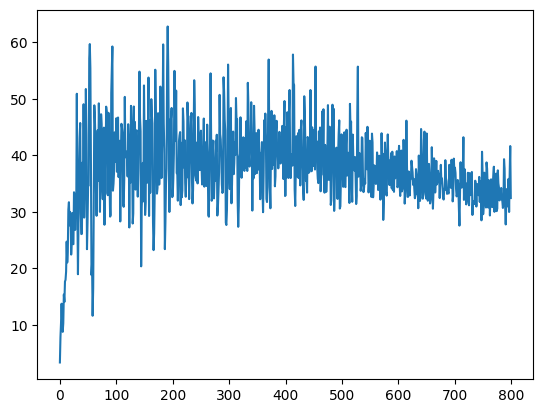

tensor(32.4371, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 708.8843994140625
Style Loss: 223.51809692382812
Total Variation Loss: 30.279251098632812
Training Batch: 801 Loss: 962.681702
****************************
****************************
Content Loss: 813.9362182617188
Style Loss: 253.26657104492188
Total Variation Loss: 34.503318786621094
Training Batch: 802 Loss: 1101.706055
****************************
****************************
Content Loss: 706.2347412109375
Style Loss: 234.24392700195312
Total Variation Loss: 34.951717376708984
Training Batch: 803 Loss: 975.430359
****************************
****************************
Content Loss: 890.2830200195312
Style Loss: 242.609375
Total Variation Loss: 31.849027633666992
Training Batch: 804 Loss: 1164.741333
****************************
****************************
Content Loss: 930.0426635742188
Style Loss: 343.984130859375
Total Variation Loss: 36.175472259521484
Training Batch: 805 Lo

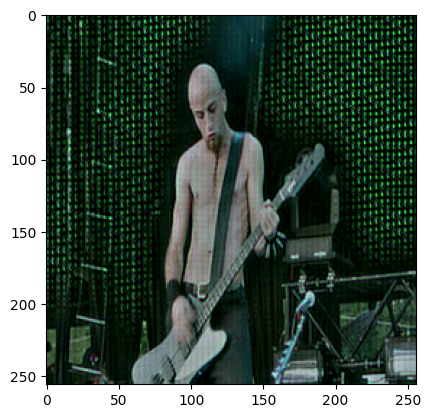

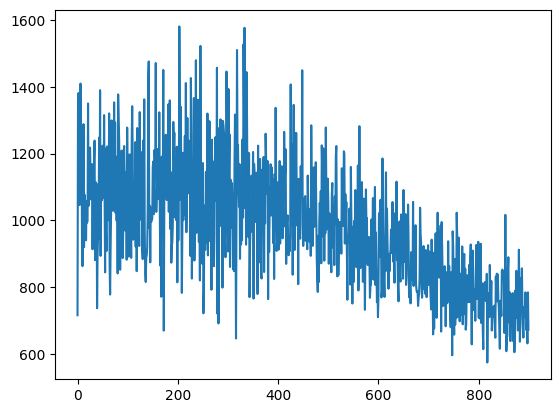

tensor(672.9323, device='cuda:0', grad_fn=<MulBackward0>)


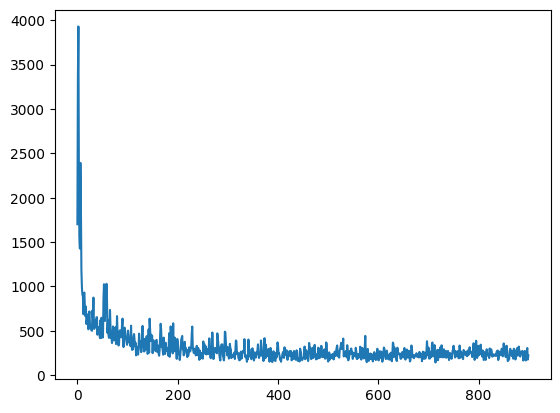

tensor(222.2414, device='cuda:0', grad_fn=<MulBackward0>)


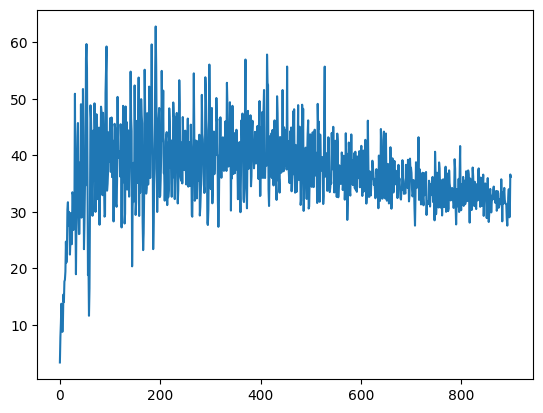

tensor(36.2069, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 839.9498291015625
Style Loss: 355.9715881347656
Total Variation Loss: 34.854305267333984
Training Batch: 901 Loss: 1230.775635
****************************
****************************
Content Loss: 685.2960815429688
Style Loss: 252.68309020996094
Total Variation Loss: 29.241552352905273
Training Batch: 902 Loss: 967.220764
****************************
****************************
Content Loss: 828.5751342773438
Style Loss: 218.91575622558594
Total Variation Loss: 36.6130256652832
Training Batch: 903 Loss: 1084.103882
****************************
****************************
Content Loss: 748.7643432617188
Style Loss: 183.47198486328125
Total Variation Loss: 37.808345794677734
Training Batch: 904 Loss: 970.044678
****************************
****************************
Content Loss: 737.50244140625
Style Loss: 264.61138916015625
Total Variation Loss: 32.77262878417969
Training Batch: 90

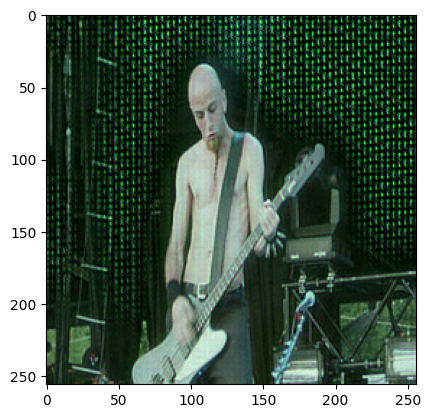

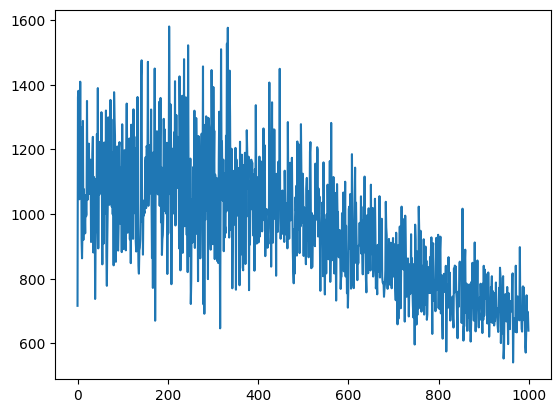

tensor(639.2123, device='cuda:0', grad_fn=<MulBackward0>)


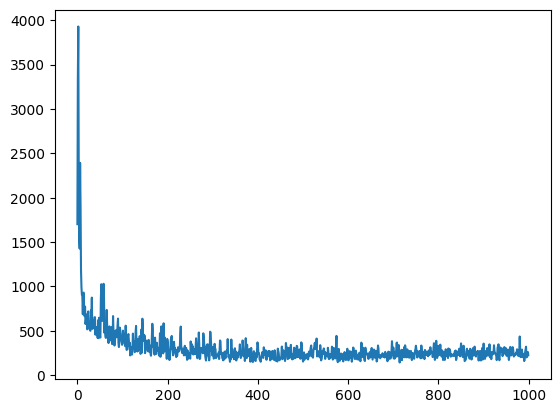

tensor(228.0869, device='cuda:0', grad_fn=<MulBackward0>)


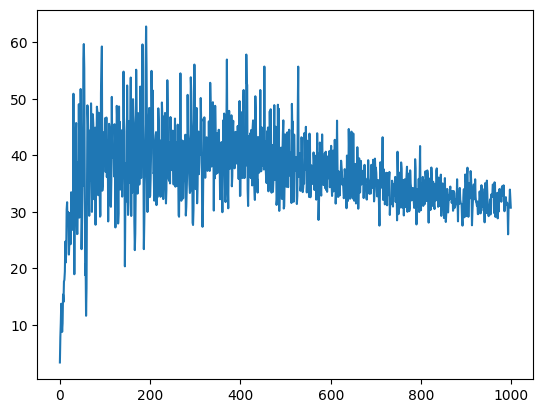

tensor(30.7275, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 560.9369506835938
Style Loss: 318.73223876953125
Total Variation Loss: 32.41211700439453
Training Batch: 1001 Loss: 912.081299
****************************
****************************
Content Loss: 540.3419189453125
Style Loss: 241.8193359375
Total Variation Loss: 29.090566635131836
Training Batch: 1002 Loss: 811.251831
****************************
****************************
Content Loss: 752.9478759765625
Style Loss: 215.19859313964844
Total Variation Loss: 35.03241729736328
Training Batch: 1003 Loss: 1003.178894
****************************
****************************
Content Loss: 702.3731689453125
Style Loss: 190.9982452392578
Total Variation Loss: 33.70479202270508
Training Batch: 1004 Loss: 927.076172
****************************
****************************
Content Loss: 627.841796875
Style Loss: 251.0009765625
Total Variation Loss: 33.02705764770508
Training Batch: 1005 Loss:

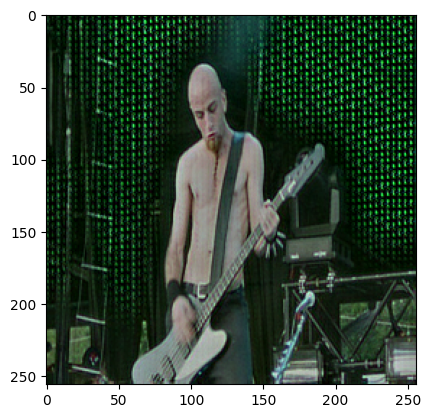

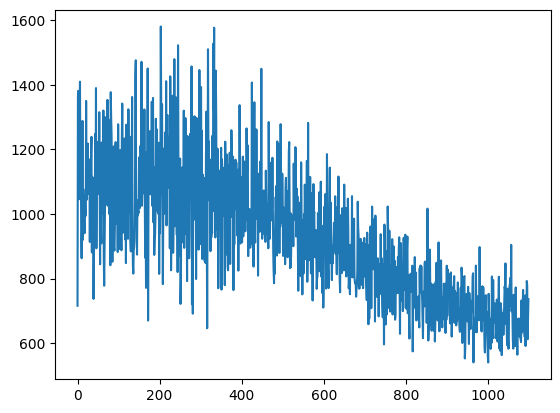

tensor(736.1696, device='cuda:0', grad_fn=<MulBackward0>)


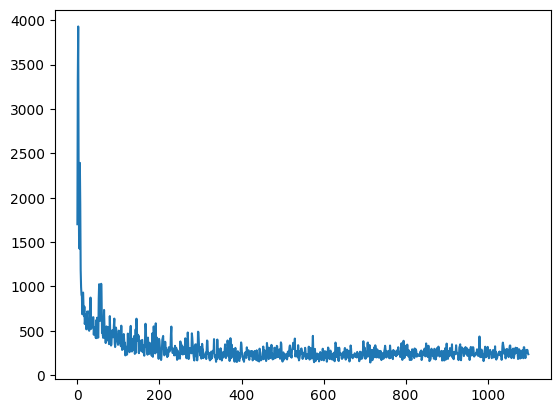

tensor(236.1400, device='cuda:0', grad_fn=<MulBackward0>)


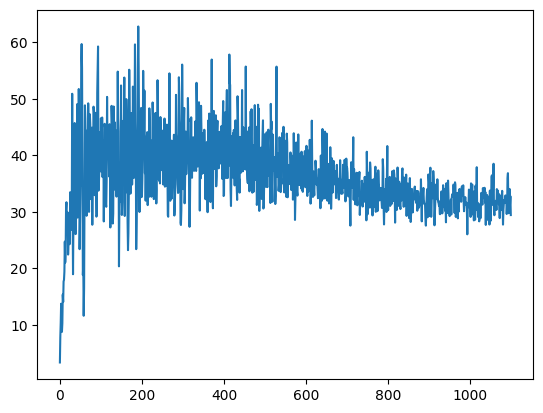

tensor(29.4217, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 633.8010864257812
Style Loss: 248.4788055419922
Total Variation Loss: 29.730268478393555
Training Batch: 1101 Loss: 912.010193
****************************
****************************
Content Loss: 751.2151489257812
Style Loss: 243.321533203125
Total Variation Loss: 33.09542465209961
Training Batch: 1102 Loss: 1027.632080
****************************
****************************
Content Loss: 671.491455078125
Style Loss: 212.24063110351562
Total Variation Loss: 32.742218017578125
Training Batch: 1103 Loss: 916.474243
****************************
****************************
Content Loss: 644.9971923828125
Style Loss: 278.79486083984375
Total Variation Loss: 28.37692642211914
Training Batch: 1104 Loss: 952.169006
****************************
****************************
Content Loss: 603.3677368164062
Style Loss: 240.53414916992188
Total Variation Loss: 30.07956314086914
Training Batch: 

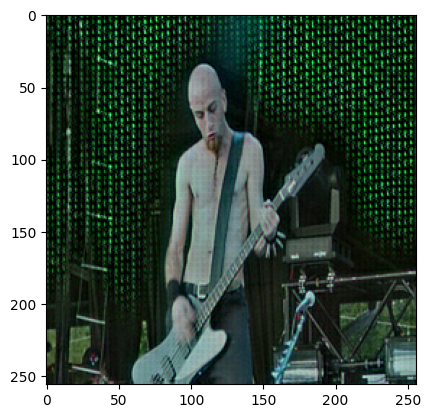

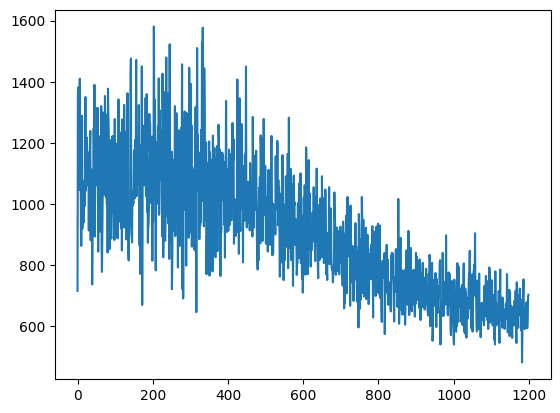

tensor(703.2993, device='cuda:0', grad_fn=<MulBackward0>)


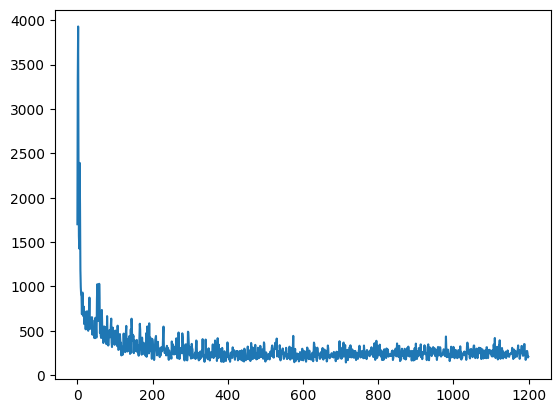

tensor(208.0751, device='cuda:0', grad_fn=<MulBackward0>)


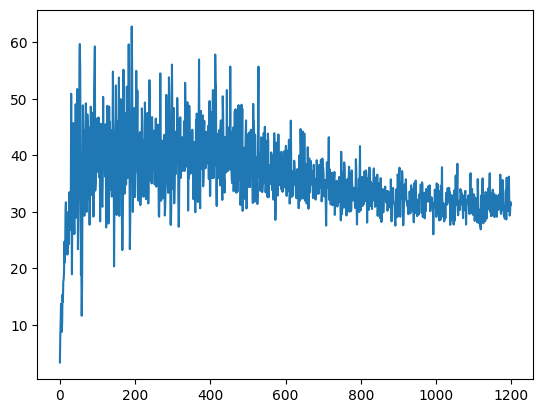

tensor(31.1887, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 549.6110229492188
Style Loss: 233.42132568359375
Total Variation Loss: 32.30841064453125
Training Batch: 1201 Loss: 815.340759
****************************
****************************
Content Loss: 639.3805541992188
Style Loss: 169.53799438476562
Total Variation Loss: 29.01311683654785
Training Batch: 1202 Loss: 837.931702
****************************
****************************
Content Loss: 606.9061889648438
Style Loss: 239.79916381835938
Total Variation Loss: 31.640310287475586
Training Batch: 1203 Loss: 878.345642
****************************
****************************
Content Loss: 524.1051635742188
Style Loss: 252.17575073242188
Total Variation Loss: 29.01458740234375
Training Batch: 1204 Loss: 805.295471
****************************
****************************
Content Loss: 608.0687255859375
Style Loss: 231.96621704101562
Total Variation Loss: 32.32563781738281
Training Batch

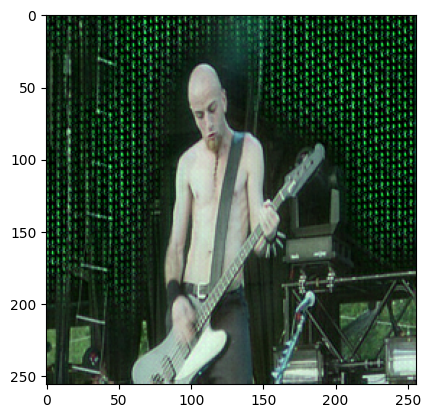

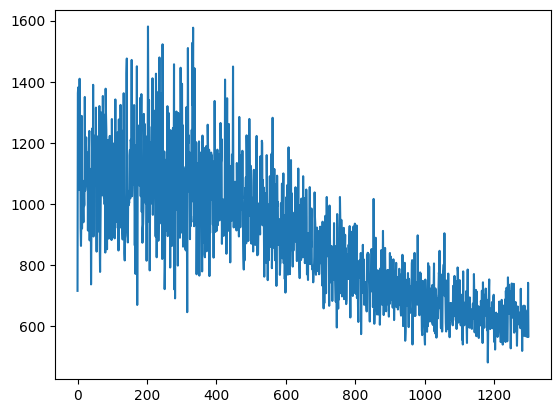

tensor(567.1025, device='cuda:0', grad_fn=<MulBackward0>)


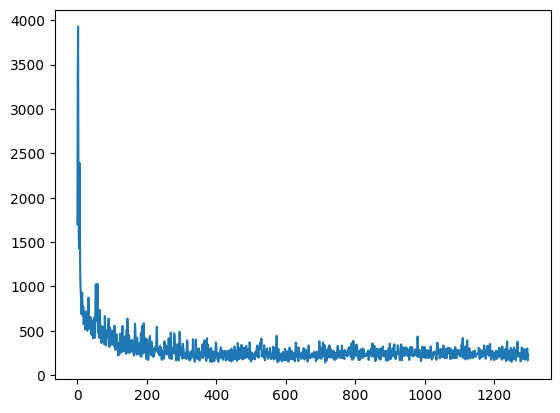

tensor(231.2766, device='cuda:0', grad_fn=<MulBackward0>)


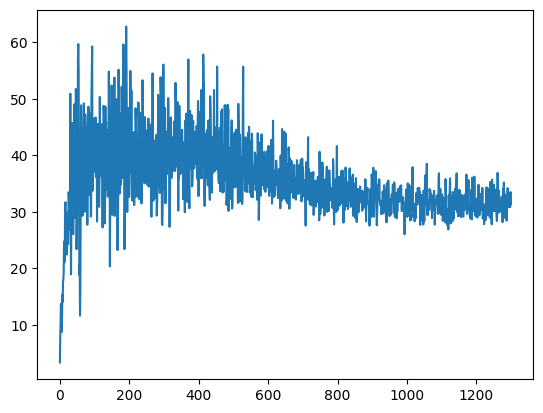

tensor(31.3441, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 610.4307250976562
Style Loss: 322.7658996582031
Total Variation Loss: 29.521251678466797
Training Batch: 1301 Loss: 962.717896
****************************
****************************
Content Loss: 606.208251953125
Style Loss: 237.27716064453125
Total Variation Loss: 28.976619720458984
Training Batch: 1302 Loss: 872.462036
****************************
****************************
Content Loss: 621.8698120117188
Style Loss: 325.1366271972656
Total Variation Loss: 30.4139347076416
Training Batch: 1303 Loss: 977.420410
****************************
****************************
Content Loss: 653.1004638671875
Style Loss: 305.8723449707031
Total Variation Loss: 32.93104553222656
Training Batch: 1304 Loss: 991.903809
****************************
****************************
Content Loss: 610.640380859375
Style Loss: 197.90789794921875
Total Variation Loss: 27.970319747924805
Training Batch: 13

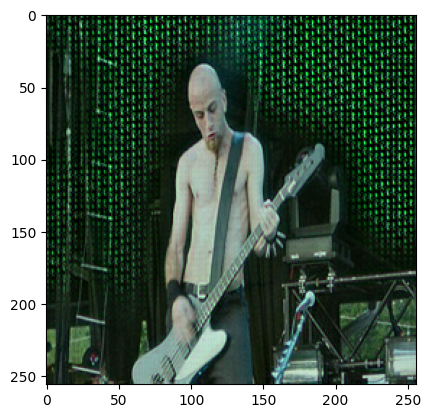

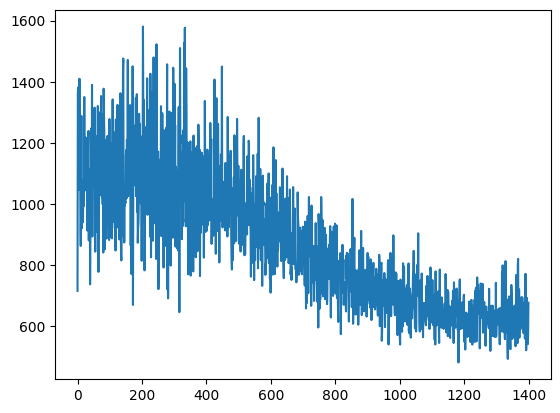

tensor(677.2949, device='cuda:0', grad_fn=<MulBackward0>)


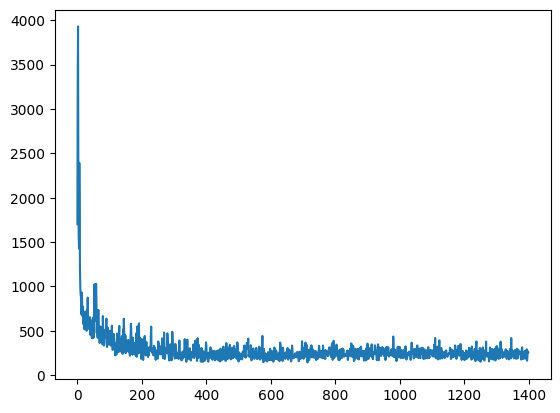

tensor(257.7624, device='cuda:0', grad_fn=<MulBackward0>)


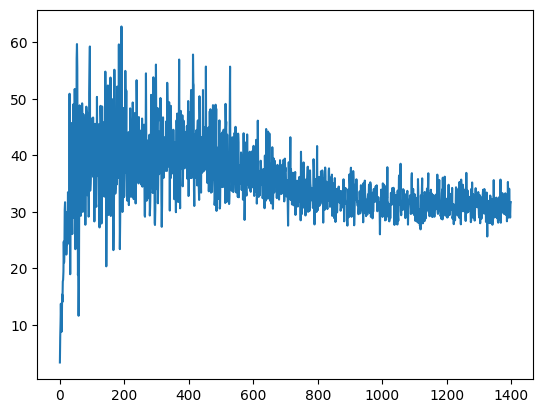

tensor(31.7102, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 630.64453125
Style Loss: 208.78610229492188
Total Variation Loss: 31.745264053344727
Training Batch: 1401 Loss: 871.175903
****************************
****************************
Content Loss: 683.349853515625
Style Loss: 269.5806579589844
Total Variation Loss: 30.098758697509766
Training Batch: 1402 Loss: 983.029297
****************************
****************************
Content Loss: 701.8675537109375
Style Loss: 335.55352783203125
Total Variation Loss: 31.617000579833984
Training Batch: 1403 Loss: 1069.038086
****************************
****************************
Content Loss: 604.78125
Style Loss: 247.9302978515625
Total Variation Loss: 31.23982048034668
Training Batch: 1404 Loss: 883.951355
****************************
****************************
Content Loss: 633.3380737304688
Style Loss: 247.2859344482422
Total Variation Loss: 30.636695861816406
Training Batch: 1405 Loss: 

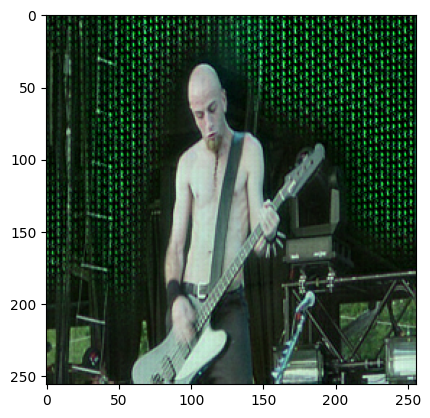

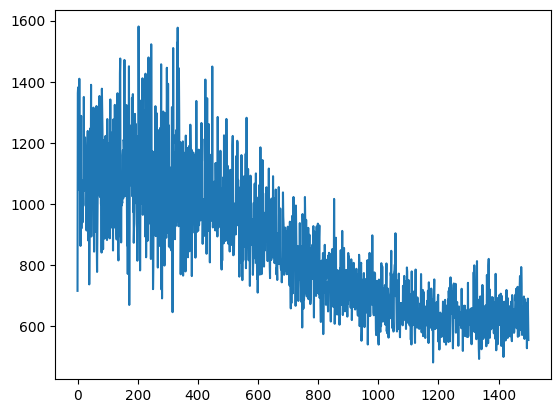

tensor(555.3106, device='cuda:0', grad_fn=<MulBackward0>)


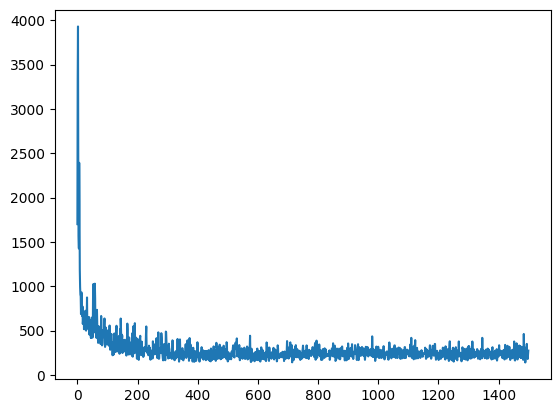

tensor(275.0181, device='cuda:0', grad_fn=<MulBackward0>)


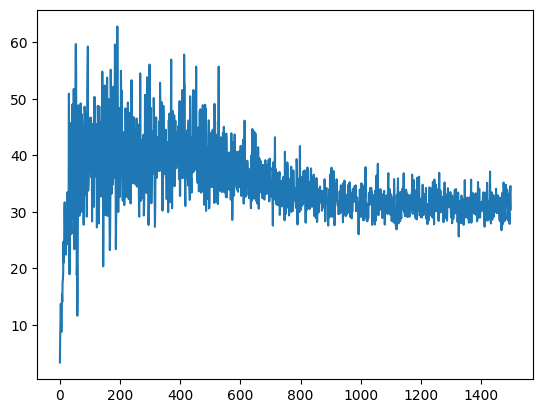

tensor(30.4280, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 591.8781127929688
Style Loss: 261.83953857421875
Total Variation Loss: 33.500030517578125
Training Batch: 1501 Loss: 887.217651
****************************
****************************
Content Loss: 627.2462768554688
Style Loss: 225.68618774414062
Total Variation Loss: 32.64777374267578
Training Batch: 1502 Loss: 885.580261
****************************
****************************
Content Loss: 626.7964477539062
Style Loss: 246.65304565429688
Total Variation Loss: 30.23037338256836
Training Batch: 1503 Loss: 903.679810
****************************
****************************
Content Loss: 607.2774047851562
Style Loss: 218.13632202148438
Total Variation Loss: 31.0703182220459
Training Batch: 1504 Loss: 856.484009
****************************
****************************
Content Loss: 580.9550170898438
Style Loss: 322.81414794921875
Total Variation Loss: 31.830921173095703
Training Batch

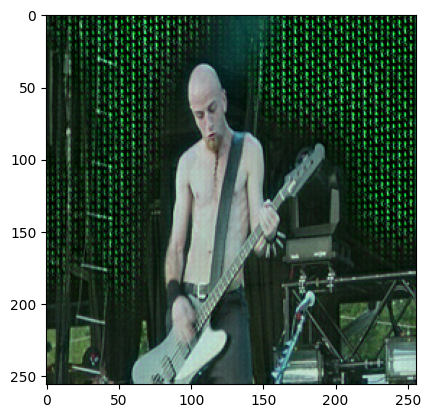

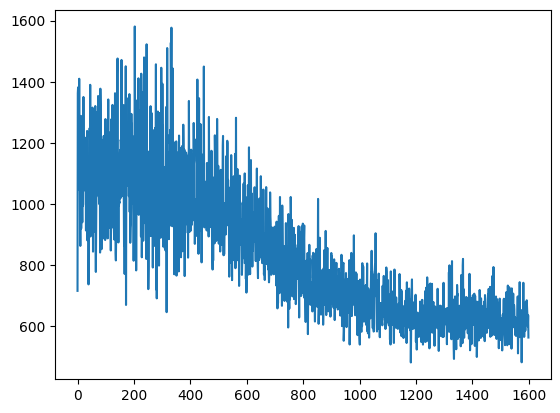

tensor(563.4099, device='cuda:0', grad_fn=<MulBackward0>)


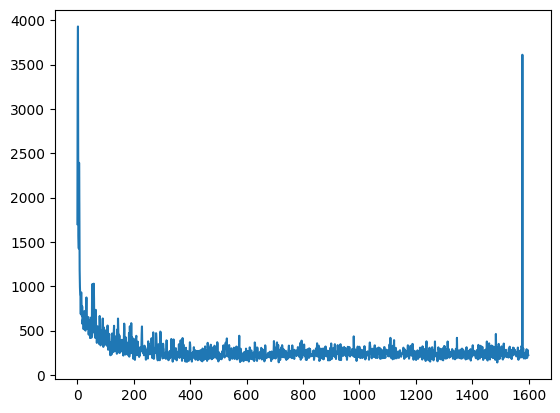

tensor(224.0124, device='cuda:0', grad_fn=<MulBackward0>)


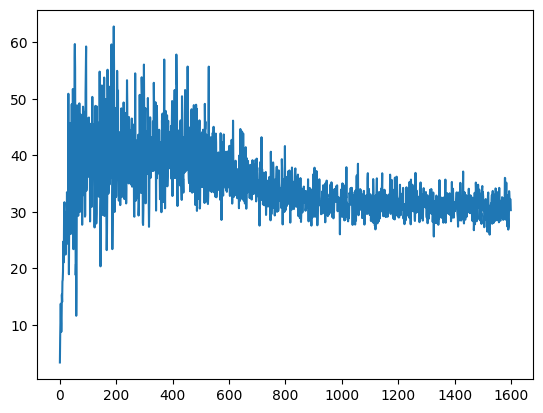

tensor(30.2923, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 620.2345581054688
Style Loss: 258.8023986816406
Total Variation Loss: 31.7001895904541
Training Batch: 1601 Loss: 910.737183
****************************
****************************
Content Loss: 701.438232421875
Style Loss: 306.1815185546875
Total Variation Loss: 31.04274559020996
Training Batch: 1602 Loss: 1038.662476
****************************
****************************
Content Loss: 594.9620971679688
Style Loss: 212.08041381835938
Total Variation Loss: 28.50000762939453
Training Batch: 1603 Loss: 835.542480
****************************
****************************
Content Loss: 572.0858764648438
Style Loss: 235.5392608642578
Total Variation Loss: 32.74666213989258
Training Batch: 1604 Loss: 840.371765
****************************
****************************
Content Loss: 531.731201171875
Style Loss: 324.66119384765625
Total Variation Loss: 32.66458511352539
Training Batch: 1605

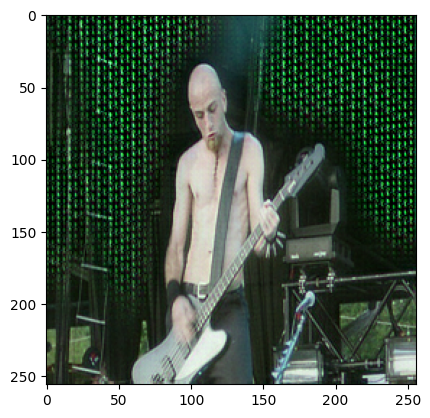

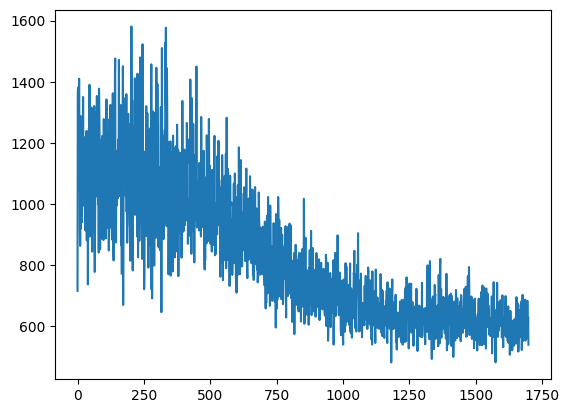

tensor(539.9689, device='cuda:0', grad_fn=<MulBackward0>)


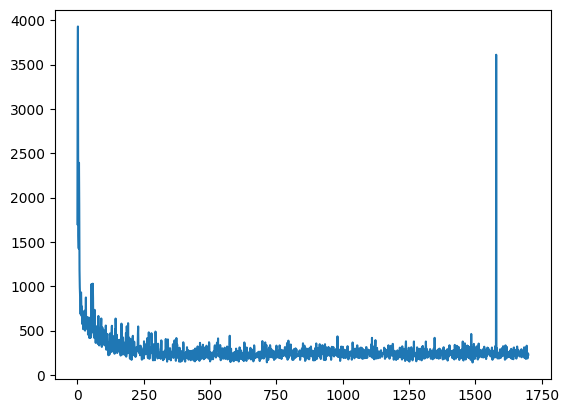

tensor(229.5688, device='cuda:0', grad_fn=<MulBackward0>)


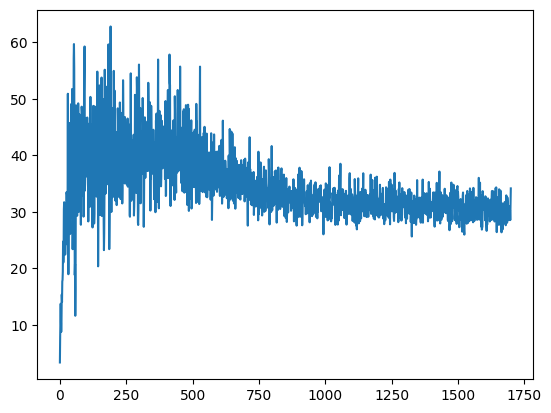

tensor(34.1442, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 611.9097290039062
Style Loss: 236.6849822998047
Total Variation Loss: 29.867708206176758
Training Batch: 1701 Loss: 878.462463
****************************
****************************
Content Loss: 617.8417358398438
Style Loss: 268.7825622558594
Total Variation Loss: 31.4841251373291
Training Batch: 1702 Loss: 918.108398
****************************
****************************
Content Loss: 599.8049926757812
Style Loss: 180.31871032714844
Total Variation Loss: 31.964431762695312
Training Batch: 1703 Loss: 812.088135
****************************
****************************
Content Loss: 585.5442504882812
Style Loss: 237.91212463378906
Total Variation Loss: 28.613670349121094
Training Batch: 1704 Loss: 852.070007
****************************
****************************
Content Loss: 464.5462646484375
Style Loss: 271.5535888671875
Total Variation Loss: 28.31107521057129
Training Batch: 

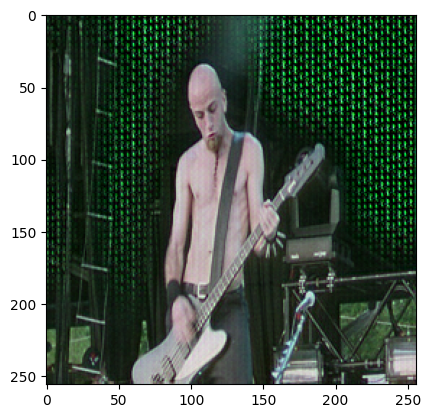

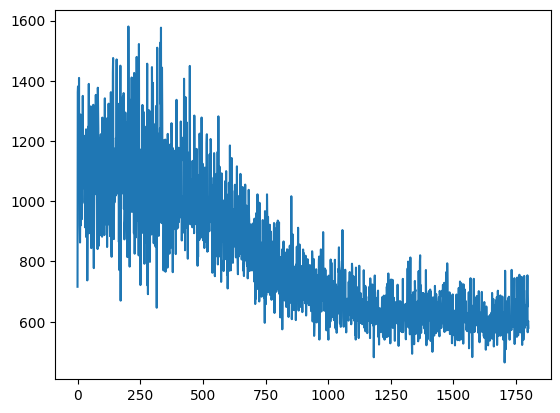

tensor(579.7057, device='cuda:0', grad_fn=<MulBackward0>)


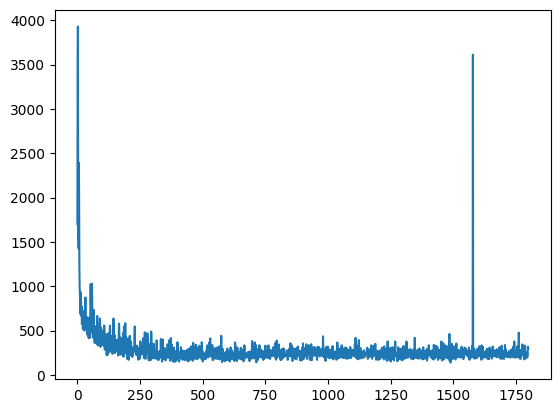

tensor(300.7493, device='cuda:0', grad_fn=<MulBackward0>)


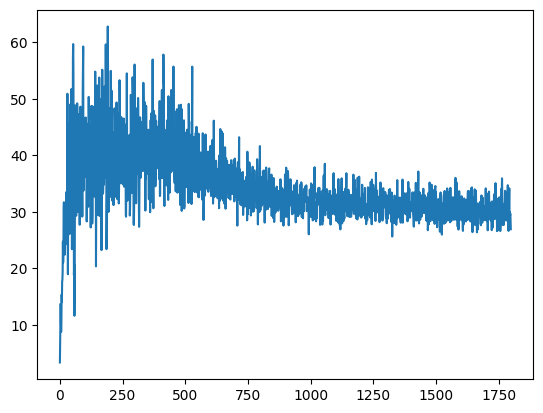

tensor(26.9106, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 610.2391357421875
Style Loss: 268.55657958984375
Total Variation Loss: 29.761539459228516
Training Batch: 1801 Loss: 908.557251
****************************
****************************
Content Loss: 673.6983032226562
Style Loss: 249.57254028320312
Total Variation Loss: 30.956260681152344
Training Batch: 1802 Loss: 954.227112
****************************
****************************
Content Loss: 669.5194091796875
Style Loss: 194.1221923828125
Total Variation Loss: 28.837329864501953
Training Batch: 1803 Loss: 892.478943
****************************
****************************
Content Loss: 693.16552734375
Style Loss: 233.13787841796875
Total Variation Loss: 29.23724365234375
Training Batch: 1804 Loss: 955.540649
****************************
****************************
Content Loss: 625.9837646484375
Style Loss: 211.46241760253906
Total Variation Loss: 27.095020294189453
Training Batch

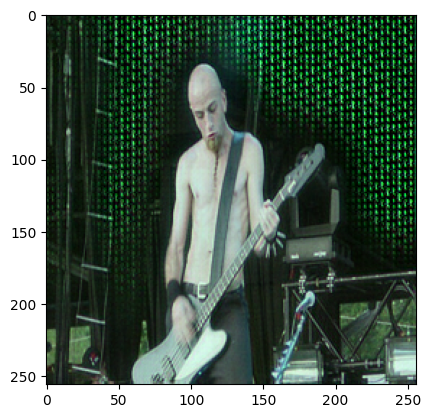

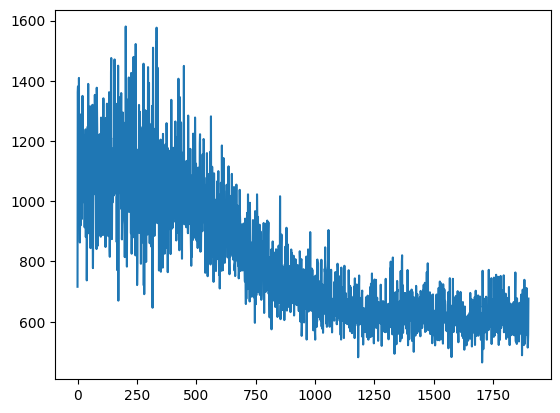

tensor(676.8314, device='cuda:0', grad_fn=<MulBackward0>)


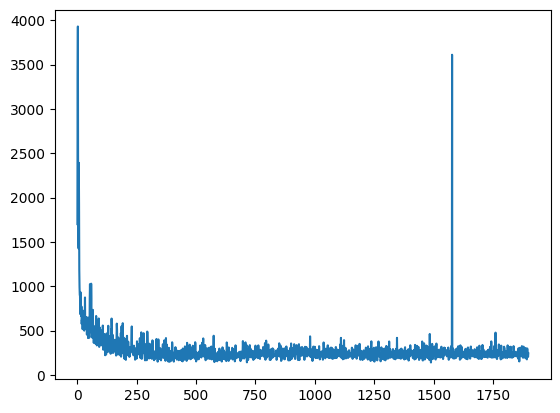

tensor(243.5024, device='cuda:0', grad_fn=<MulBackward0>)


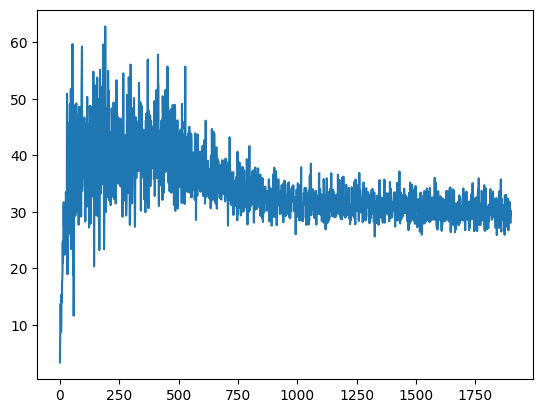

tensor(28.1066, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 621.6000366210938
Style Loss: 291.8309631347656
Total Variation Loss: 29.07645034790039
Training Batch: 1901 Loss: 942.507507
****************************
****************************
Content Loss: 584.2085571289062
Style Loss: 240.35498046875
Total Variation Loss: 28.920501708984375
Training Batch: 1902 Loss: 853.484009
****************************
****************************
Content Loss: 530.8143920898438
Style Loss: 267.74383544921875
Total Variation Loss: 30.638500213623047
Training Batch: 1903 Loss: 829.196716
****************************
****************************
Content Loss: 698.0255126953125
Style Loss: 326.8044738769531
Total Variation Loss: 33.93467712402344
Training Batch: 1904 Loss: 1058.764648
****************************
****************************
Content Loss: 661.0509643554688
Style Loss: 248.89671325683594
Total Variation Loss: 33.11043930053711
Training Batch: 1

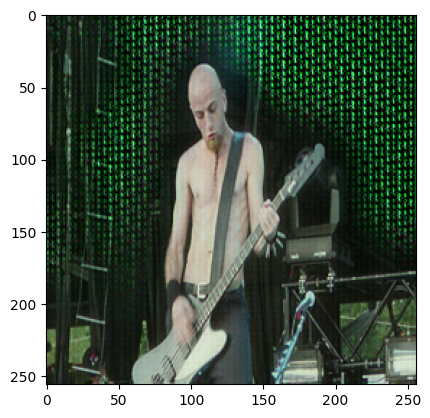

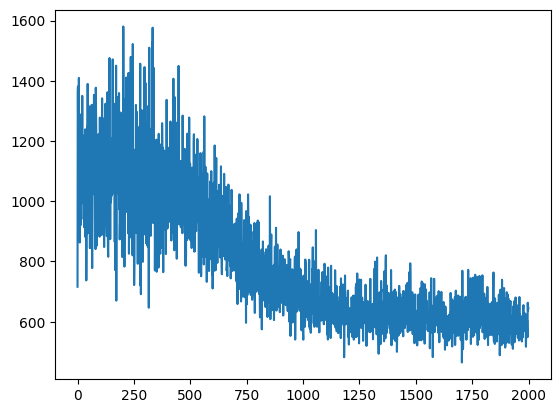

tensor(644.7922, device='cuda:0', grad_fn=<MulBackward0>)


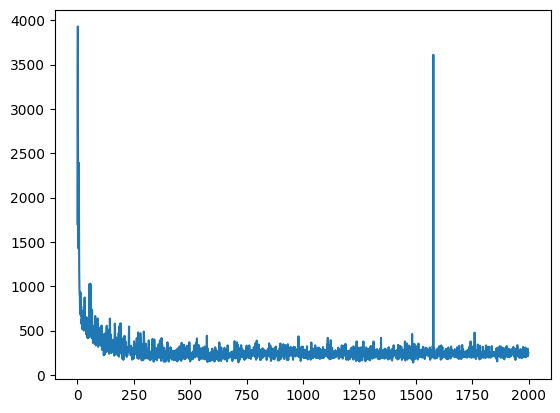

tensor(249.2234, device='cuda:0', grad_fn=<MulBackward0>)


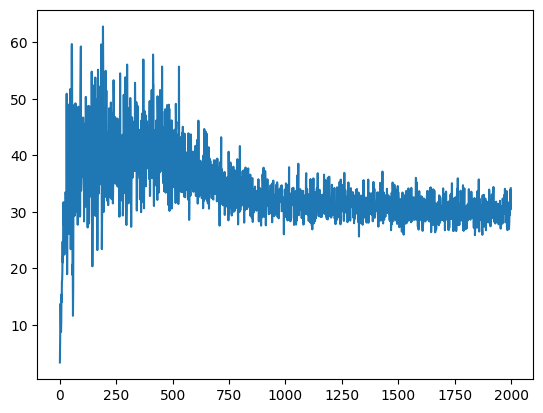

tensor(34.1724, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 602.364990234375
Style Loss: 326.239501953125
Total Variation Loss: 32.66584014892578
Training Batch: 2001 Loss: 961.270325
****************************
****************************
Content Loss: 519.847412109375
Style Loss: 346.04541015625
Total Variation Loss: 31.9260196685791
Training Batch: 2002 Loss: 897.818848
****************************
****************************
Content Loss: 570.7351684570312
Style Loss: 304.9576721191406
Total Variation Loss: 29.766435623168945
Training Batch: 2003 Loss: 905.459290
****************************
****************************
Content Loss: 520.477294921875
Style Loss: 227.6313934326172
Total Variation Loss: 27.366363525390625
Training Batch: 2004 Loss: 775.475098
****************************
****************************
Content Loss: 642.445556640625
Style Loss: 215.19178771972656
Total Variation Loss: 33.57982635498047
Training Batch: 2005 Loss

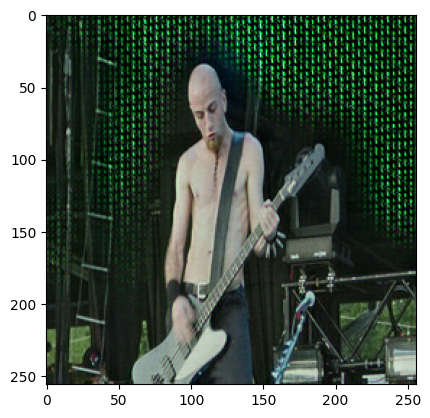

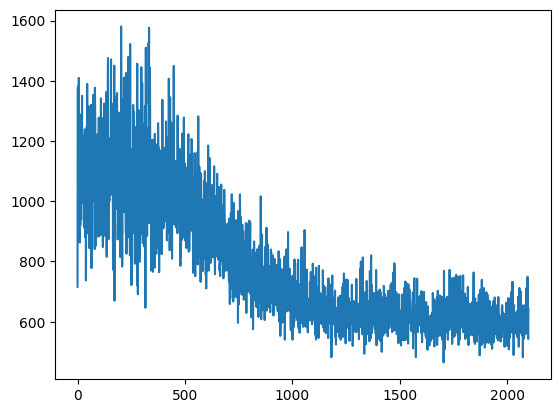

tensor(643.5136, device='cuda:0', grad_fn=<MulBackward0>)


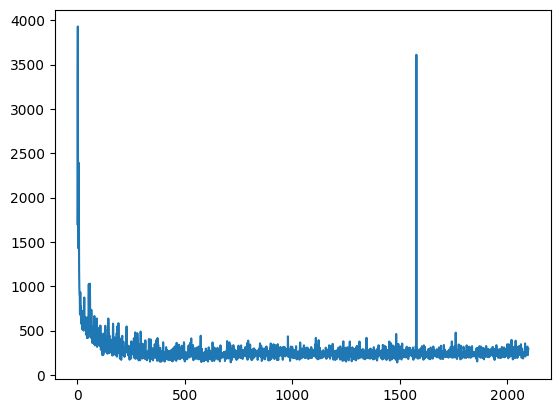

tensor(295.2579, device='cuda:0', grad_fn=<MulBackward0>)


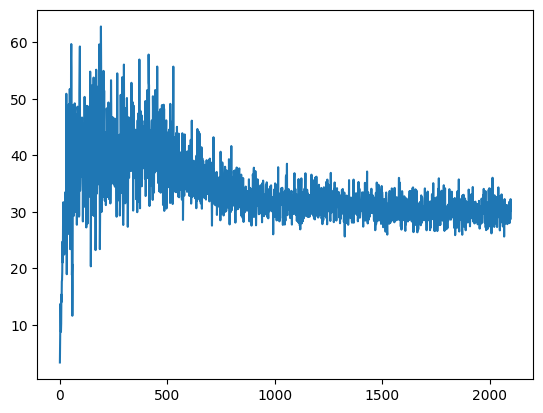

tensor(30.1811, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 512.5654907226562
Style Loss: 218.8607177734375
Total Variation Loss: 28.546607971191406
Training Batch: 2101 Loss: 759.972839
****************************
****************************
Content Loss: 660.3338012695312
Style Loss: 254.66485595703125
Total Variation Loss: 29.32786750793457
Training Batch: 2102 Loss: 944.326538
****************************
****************************
Content Loss: 649.1775512695312
Style Loss: 234.06759643554688
Total Variation Loss: 28.59003257751465
Training Batch: 2103 Loss: 911.835144
****************************
****************************
Content Loss: 655.8033447265625
Style Loss: 240.34469604492188
Total Variation Loss: 27.078824996948242
Training Batch: 2104 Loss: 923.226868
****************************
****************************
Content Loss: 633.7832641601562
Style Loss: 233.05322265625
Total Variation Loss: 29.490447998046875
Training Batch: 

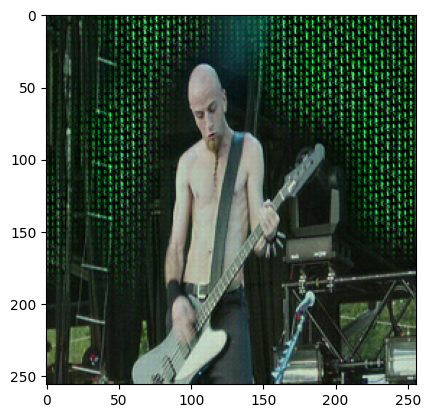

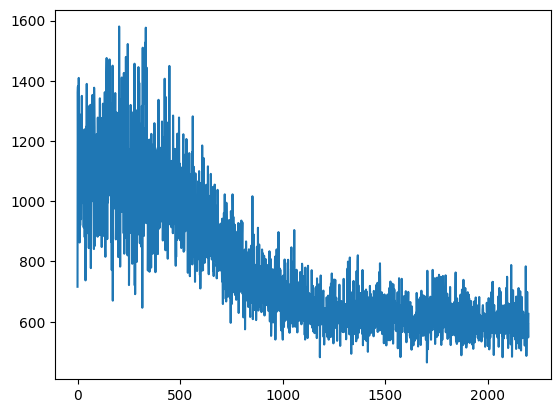

tensor(625.9409, device='cuda:0', grad_fn=<MulBackward0>)


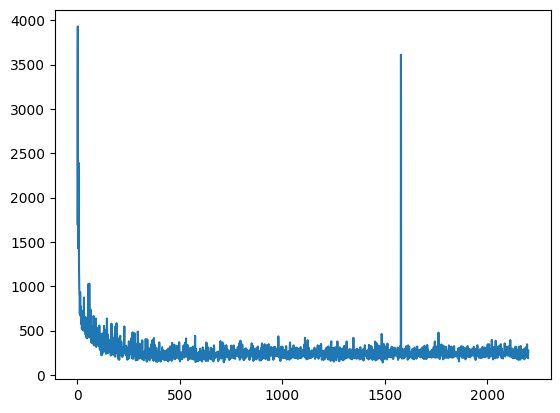

tensor(274.0948, device='cuda:0', grad_fn=<MulBackward0>)


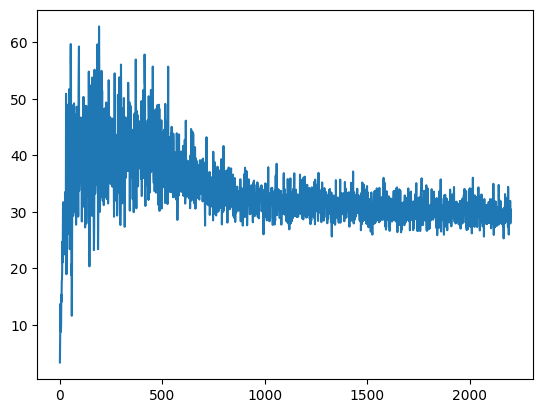

tensor(30.3812, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 636.3131103515625
Style Loss: 315.3171081542969
Total Variation Loss: 32.56260299682617
Training Batch: 2201 Loss: 984.192871
****************************
****************************
Content Loss: 571.001220703125
Style Loss: 212.00088500976562
Total Variation Loss: 28.623756408691406
Training Batch: 2202 Loss: 811.625854
****************************
****************************
Content Loss: 624.0567626953125
Style Loss: 237.28326416015625
Total Variation Loss: 28.60836410522461
Training Batch: 2203 Loss: 889.948364
****************************
****************************
Content Loss: 627.5714111328125
Style Loss: 256.8981018066406
Total Variation Loss: 33.61073303222656
Training Batch: 2204 Loss: 918.080200
****************************
****************************
Content Loss: 601.4439086914062
Style Loss: 266.4529113769531
Total Variation Loss: 32.74592208862305
Training Batch: 22

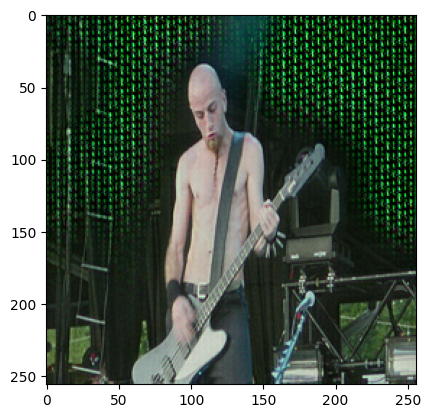

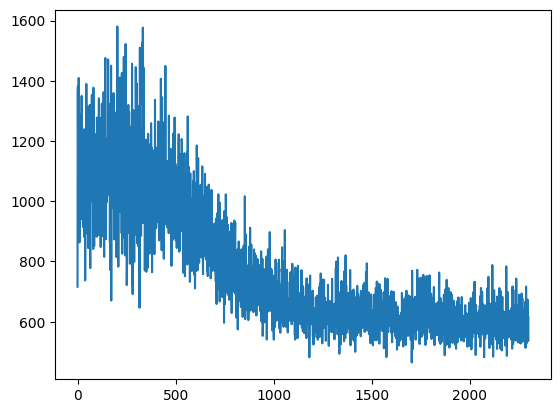

tensor(614.1564, device='cuda:0', grad_fn=<MulBackward0>)


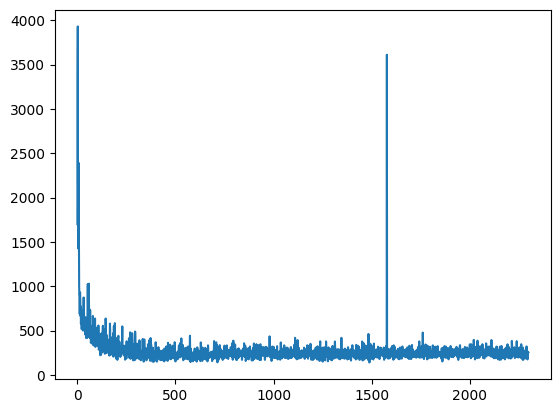

tensor(255.0922, device='cuda:0', grad_fn=<MulBackward0>)


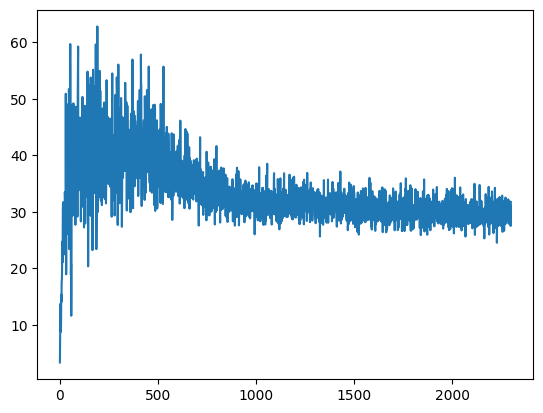

tensor(31.7414, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 597.2247924804688
Style Loss: 188.73077392578125
Total Variation Loss: 28.895992279052734
Training Batch: 2301 Loss: 814.851562
****************************
****************************
Content Loss: 562.99853515625
Style Loss: 251.9114990234375
Total Variation Loss: 27.23120880126953
Training Batch: 2302 Loss: 842.141235
****************************
****************************
Content Loss: 634.8101806640625
Style Loss: 295.08807373046875
Total Variation Loss: 33.402530670166016
Training Batch: 2303 Loss: 963.300781
****************************
****************************
Content Loss: 627.4403686523438
Style Loss: 214.5596160888672
Total Variation Loss: 30.48679542541504
Training Batch: 2304 Loss: 872.486816
****************************
****************************
Content Loss: 521.7183837890625
Style Loss: 192.84353637695312
Total Variation Loss: 32.04986572265625
Training Batch: 2

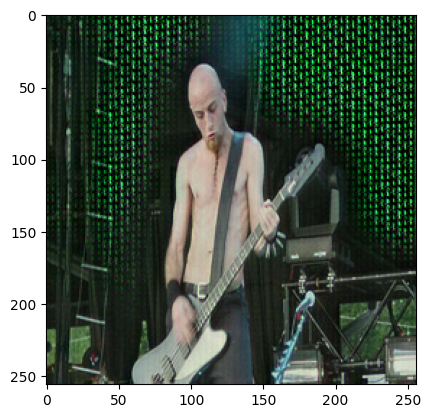

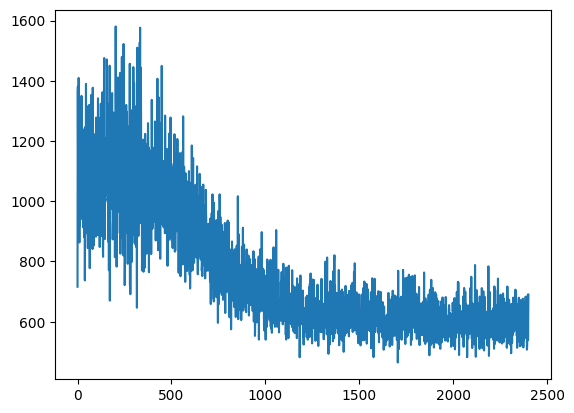

tensor(690.2233, device='cuda:0', grad_fn=<MulBackward0>)


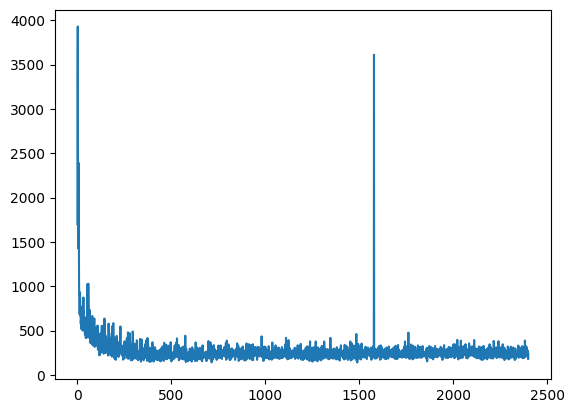

tensor(237.4599, device='cuda:0', grad_fn=<MulBackward0>)


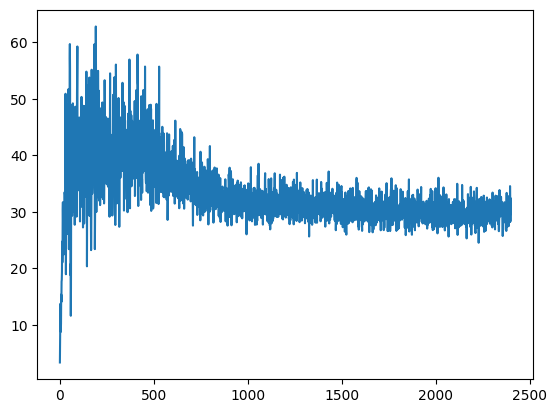

tensor(29.6073, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 671.4130249023438
Style Loss: 299.8162841796875
Total Variation Loss: 31.093629837036133
Training Batch: 2401 Loss: 1002.322937
****************************
****************************
Content Loss: 561.6377563476562
Style Loss: 263.7014465332031
Total Variation Loss: 32.30991744995117
Training Batch: 2402 Loss: 857.649170
****************************
****************************
Content Loss: 674.0451049804688
Style Loss: 267.7980041503906
Total Variation Loss: 29.470983505249023
Training Batch: 2403 Loss: 971.314148
****************************
****************************
Content Loss: 630.8461303710938
Style Loss: 189.53634643554688
Total Variation Loss: 29.917194366455078
Training Batch: 2404 Loss: 850.299622
****************************
****************************
Content Loss: 580.1195068359375
Style Loss: 219.50726318359375
Total Variation Loss: 30.75507164001465
Training Batch

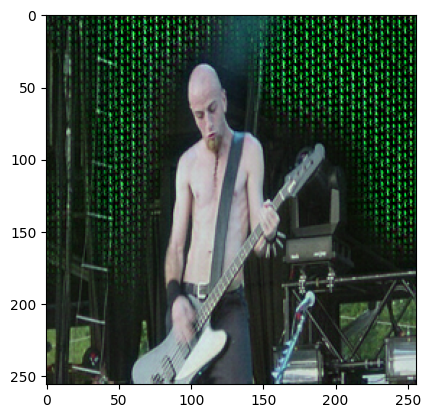

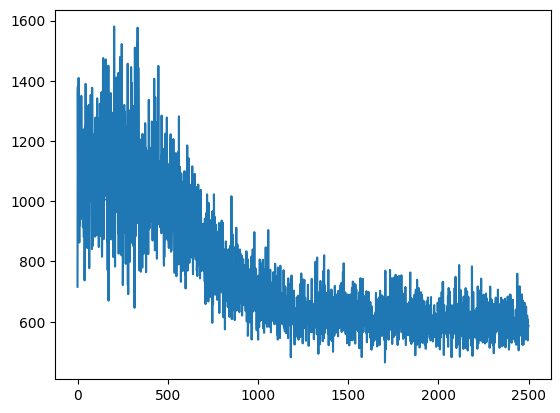

tensor(586.9458, device='cuda:0', grad_fn=<MulBackward0>)


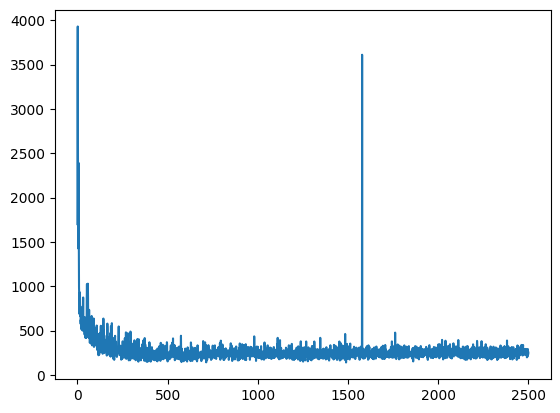

tensor(253.5451, device='cuda:0', grad_fn=<MulBackward0>)


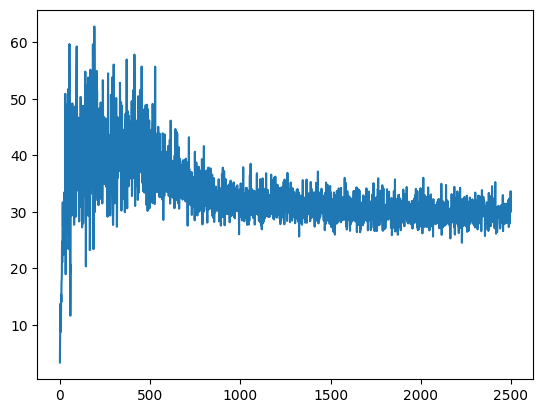

tensor(30.1214, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 623.7586059570312
Style Loss: 407.4755859375
Total Variation Loss: 29.890283584594727
Training Batch: 2501 Loss: 1061.124390
****************************
****************************
Content Loss: 546.6622314453125
Style Loss: 291.1130065917969
Total Variation Loss: 28.27957534790039
Training Batch: 2502 Loss: 866.054871
****************************
****************************
Content Loss: 559.5037231445312
Style Loss: 253.78306579589844
Total Variation Loss: 28.863584518432617
Training Batch: 2503 Loss: 842.150391
****************************
****************************
Content Loss: 529.0147094726562
Style Loss: 227.43011474609375
Total Variation Loss: 29.28601837158203
Training Batch: 2504 Loss: 785.730835
****************************
****************************
Content Loss: 633.073486328125
Style Loss: 198.50674438476562
Total Variation Loss: 32.26710510253906
Training Batch: 25

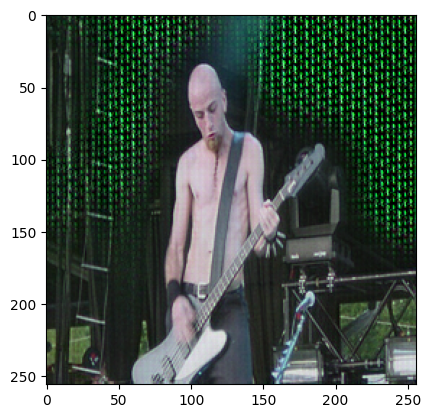

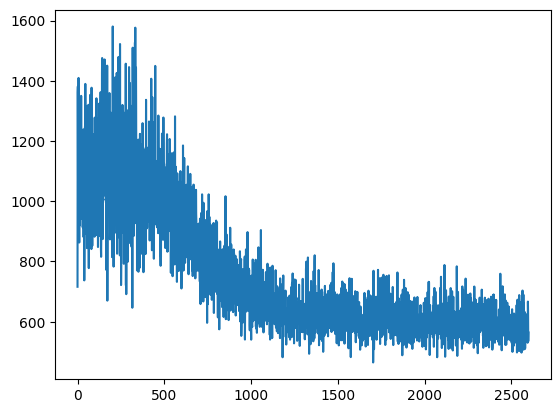

tensor(564.2586, device='cuda:0', grad_fn=<MulBackward0>)


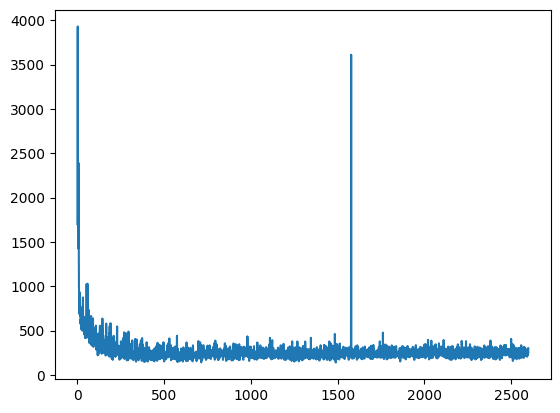

tensor(301.9899, device='cuda:0', grad_fn=<MulBackward0>)


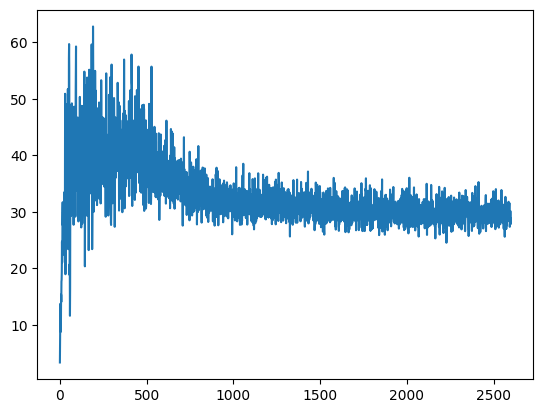

tensor(28.7694, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 645.7308959960938
Style Loss: 239.399658203125
Total Variation Loss: 33.2275505065918
Training Batch: 2601 Loss: 918.358093
****************************
****************************
Content Loss: 614.1517333984375
Style Loss: 183.97073364257812
Total Variation Loss: 29.233983993530273
Training Batch: 2602 Loss: 827.356445
****************************
****************************
Content Loss: 548.03125
Style Loss: 239.51451110839844
Total Variation Loss: 28.197256088256836
Training Batch: 2603 Loss: 815.743042
****************************
****************************
Content Loss: 559.7697143554688
Style Loss: 255.3497314453125
Total Variation Loss: 30.85077667236328
Training Batch: 2604 Loss: 845.970215
****************************
****************************
Content Loss: 566.7796020507812
Style Loss: 273.6308288574219
Total Variation Loss: 29.920976638793945
Training Batch: 2605 Loss

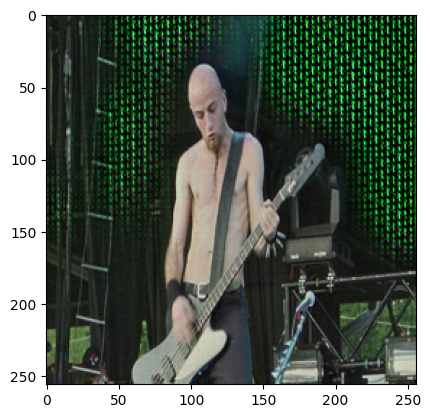

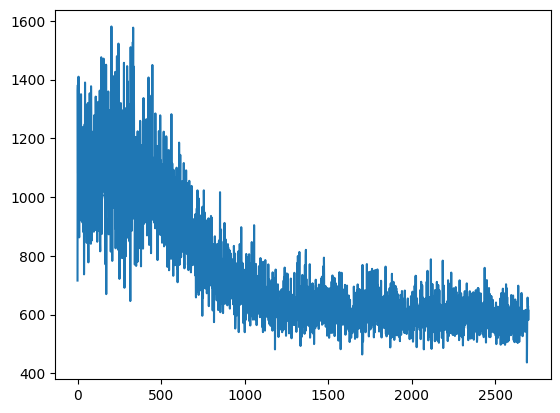

tensor(613.3647, device='cuda:0', grad_fn=<MulBackward0>)


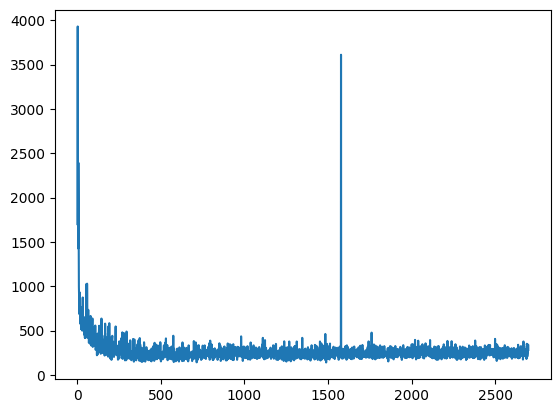

tensor(282.4102, device='cuda:0', grad_fn=<MulBackward0>)


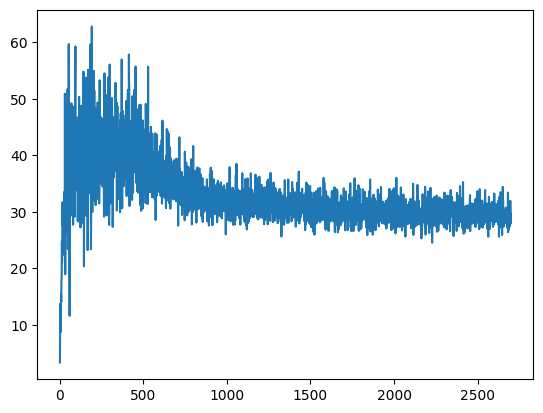

tensor(29.5895, device='cuda:0', grad_fn=<MulBackward0>)
****************************
Content Loss: 585.6749267578125
Style Loss: 231.8385467529297
Total Variation Loss: 32.70308303833008
Training Batch: 2701 Loss: 850.216553
****************************
****************************
Content Loss: 603.7074584960938
Style Loss: 204.8692169189453
Total Variation Loss: 29.40302848815918
Training Batch: 2702 Loss: 837.979675
****************************
****************************
Content Loss: 582.232177734375
Style Loss: 194.703369140625
Total Variation Loss: 30.61720085144043
Training Batch: 2703 Loss: 807.552734
****************************
****************************
Content Loss: 559.1742553710938
Style Loss: 253.7073516845703
Total Variation Loss: 27.481687545776367
Training Batch: 2704 Loss: 840.363281
****************************
****************************
Content Loss: 485.9286193847656
Style Loss: 294.98095703125
Total Variation Loss: 30.01220703125
Training Batch: 2705 Loss:

In [26]:
for epoch in range(2):
    transformation_net.train()
    for batch, _ in enumerate(range(0, MAX_TRAIN, BATCH_SIZE)):
        # Skip what we've already done
        if epoch == 0 and batch < (MAX_TRAIN/BATCH_SIZE):
            continue
        
        # The content batch is the same as the train batch, except train batch has noise added to it
        train_batch = load_training_batch(batch, BATCH_SIZE, 'train')
        content_batch = np.copy(train_batch)

        # Add noise to the training batch
        train_batch = add_noise(train_batch)

        # Convert the batches to tensors
        train_batch = torch.from_numpy(train_batch).float().to(device)
        content_batch = torch.from_numpy(content_batch).float().to(device)

        # Zero the gradients
        opt.zero_grad()

        # Forward propagate
        gen_images = transformation_net(train_batch)

        # Compute loss
        loss = total_cost(gen_images, [content_batch, STYLE_IMAGE_TENSOR.to(device)])

        # Backprop
        loss.backward()

        # Clip the gradient to minimize chance of exploding gradients
        torch.nn.utils.clip_grad_norm_(transformation_net.parameters(), 1.0)

        # Apply gradients
        opt.step()

        print("Training Batch: {}".format(batch + 1), "Loss: {:f}".format(loss))
        print('****************************')
        
        if batch % 100 == 99:
            training_show_img()
            plot_losses()
        
    transformation_net.eval()
    for batch, _ in enumerate(range(MAX_TRAIN, MAX_VAL, BATCH_SIZE)):
        # The content batch is the same as the train batch, except train batch has noise added to it
        val_batch = load_training_batch(batch, BATCH_SIZE, 'val')
        content_batch = np.copy(val_batch)
        
        # Add noise to the training batch
        val_batch = add_noise(val_batch)
        
        # Convert the batches to tensors
        val_batch = torch.from_numpy(val_batch).float().to(device)
        content_batch = torch.from_numpy(content_batch).float().to(device)
        
        # Forward propagate
        gen_images = transformation_net(val_batch)

        # Compute loss
        loss = total_cost(gen_images, [content_batch, STYLE_IMAGE_TENSOR])
        
        print("Validation Batch: {}".format(batch + 1), "Loss: {:f}".format(loss))
    
    

# Сохранение

In [27]:
torch.save(transformation_net.state_dict(), 'models/matrix_2.pt')

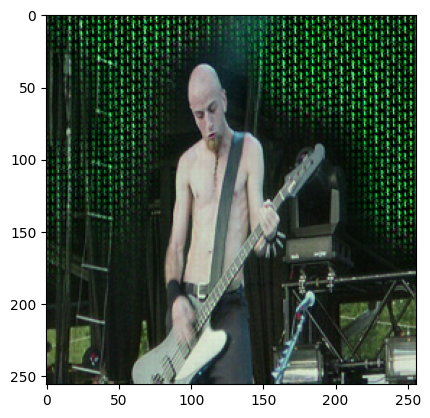

In [28]:
training_show_img()

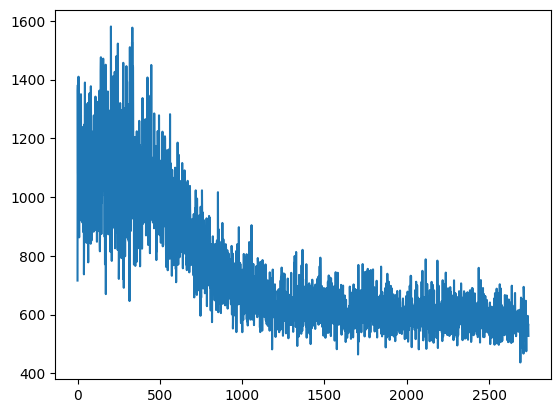

tensor(527.6628, device='cuda:0', grad_fn=<MulBackward0>)


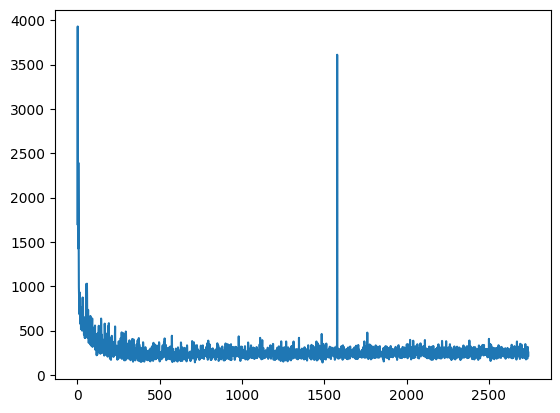

tensor(218.9008, device='cuda:0', grad_fn=<MulBackward0>)


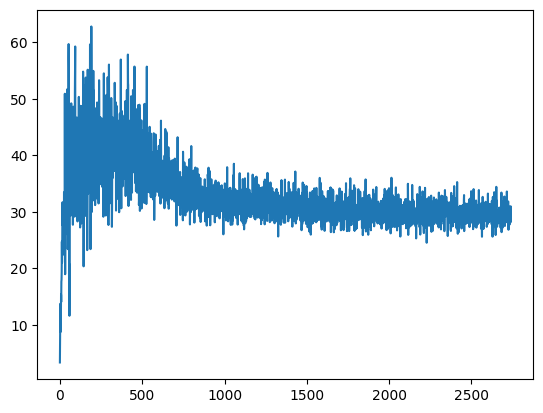

tensor(29.2658, device='cuda:0', grad_fn=<MulBackward0>)


In [29]:
plot_losses()

# Тестирование

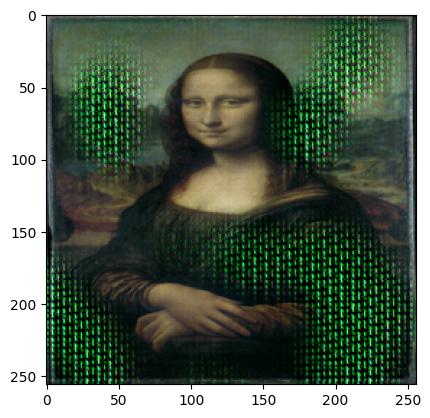

In [38]:
model_path = "models/matrix_2.pt"
transformation_net = ImageTransformationNetwork()
transformation_net.load_state_dict(torch.load(model_path))
transformation_net.to(device).eval()

img = Image.open('images/mona_lisa.jpg')
img = np.asarray(img.resize(IMG_DIMENSIONS)).transpose(2, 0, 1)[0:3]
img = torch.from_numpy(img.reshape(1, 3, 256, 256)).float().to(device)

# Вызовите модель для переноса стиля
output_image = transformation_net(img)
output_image = output_image.detach().cpu().numpy()
output_image = np.clip(output_image, 0, 255)
output_image = output_image.astype('uint8')
output_image = output_image.reshape(3, 256, 256).transpose(1, 2, 0)

plt.imshow(output_image)
plt.show()

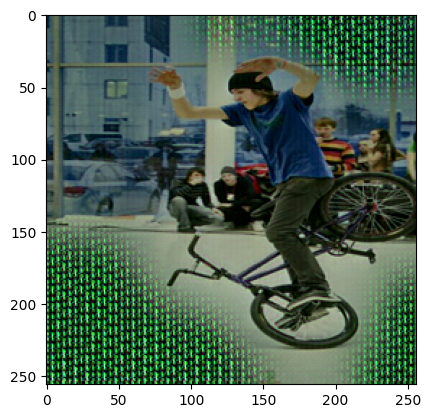

In [31]:
test = np.asarray(Image.open('test.jpg').resize(IMG_DIMENSIONS)).transpose(2, 0, 1)[0:3]
show_img(test)

# Конвертация модели

In [ ]:
from torch.utils.mobile_optimizer import optimize_for_mobile

model_path = "models/matrix_2.pt"
transformation_net = ImageTransformationNetwork()
transformation_net.load_state_dict(torch.load(model_path))

transformation_net.eval()

example_input = torch.randn(1, 3, 256, 256)

# Трассировка модели с помощью torch.jit.trace
scripted_module = torch.jit.trace(transformation_net, example_input)
#scripted_module.save("models/matrix_3_3.pt")
# Сохранение трассированной модели
optimized_scripted_module = optimize_for_mobile(scripted_module)
optimized_scripted_module._save_for_lite_interpreter("models/matrix_2.ptl")

In [42]:
model_path = "models/matrix_2.pt"
transformation_net = ImageTransformationNetwork()
transformation_net.load_state_dict(torch.load(model_path, map_location='cpu'))

# Установите модель в режим оценки
transformation_net.eval()

# Создайте пример входных данных для трассировки
dummy_input = torch.randn(1, 3, 256, 256) # Пример, замените на ваши размерности

# Трассировка модели и сохранение в формате TorchScript
traced_model = torch.jit.trace(transformation_net, dummy_input)
torch.jit.save(traced_model, "models/matrix_2_1.ptl")

c:\Users\alex_\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\jit\_script.py:1291: UserWarning: `optimize` is deprecated and has no effect. Use `with torch.jit.optimized_execution() instead
  warnings.warn(
